# N2 Super-Resolution Hallucination Analysis

This notebook performs comprehensive hallucination analysis on super-resolution models using the DIV2K dataset.

**Inverse Problem:** Super-resolution (4x downsampling)

**Models analyzed:**
- Bicubic (baseline)
- DRUNet-PnP
- Unfolded-DRS
- RAM
- DPS (confidence interval precomputed externally)

**Analysis performed:**
- Wavelet-based hallucination index (HI) computation
- Level-wise frequency class analysis
- MSE and R-value spatial maps
- Model comparison across multiple metrics

In [ ]:
import deepinv as dinv
import torch
import shutil
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import sys
import pywt
from deepinv.datasets import DIV2K
import pandas as pd
import time


import torchvision.transforms as transforms

# Set up paths
project_root = Path('PATH/TO/FILE')
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))

from src.utils.HIC_psf_fwhm_wavelet_utils import Wavelet_Hallucination_Index
from src.utils.HIC_psf_fwhm_base_utils import Hallucination_Index

device = dinv.utils.get_freer_gpu() if torch.cuda.is_available() else "cpu"
print(f'Using device: {device}')

## Load Test Dataset

In [2]:
# Load DIV2K validation dataset
print("Loading DIV2K validation dataset...")
dataset = DIV2K(root="DIV2K", mode="val", download=True)
print(f"Dataset loaded: {len(dataset)} images")

Loading DIV2K validation dataset...
Dataset loaded: 100 images


## Load Physics Operator (Super-Resolution: 4x Downsampling)

In [3]:
# Define physics operator (4x bicubic downsampling for super-resolution)
print("Setting up physics operator (4x bicubic downsampling)...")
physics = dinv.physics.Downsampling(
    img_size=(3, 256, 256),  # Will be adjusted per image
    factor=4,
    device=device,
    filter='bicubic'
)
print(f"Super-resolution factor: 4x")
print(f"Downsampling filter: bicubic")

Setting up physics operator (4x bicubic downsampling)...
Super-resolution factor: 4x
Downsampling filter: bicubic


## Load Models

Loading models from deepinv library and wrapping denoisers with ArtifactRemoval for super-resolution.

In [ ]:
# Load multiple deepinv models
print("Loading models...")

models = {}

# 1. Bicubic upsampling baseline
print("  Loading Bicubic baseline...")
class BicubicUpsampler(torch.nn.Module):
    def __init__(self, scale_factor=4):
        super().__init__()
        self.scale_factor = scale_factor
    
    def forward(self, x):
        return torch.nn.functional.interpolate(
            x, scale_factor=self.scale_factor, mode='bicubic', align_corners=False
        )

models['Bicubic'] = BicubicUpsampler(scale_factor=4).to(device)
print("    ✓ Bicubic baseline loaded")

# 2. DRUNet with PnP (Plug-and-Play)
print("  Loading DRUNet-PnP...")

# GSPnP prior setup
from deepinv.optim.data_fidelity import L2
from deepinv.optim.prior import RED, PnP
from deepinv.optim import PGD, DRS

class GSPnP(RED):
    """Gradient-Step Denoiser prior."""
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.explicit_prior = True

    def forward(self, x, *args, **kwargs):
        return self.denoiser.potential(x, *args, **kwargs)

# Parameters for PnP algorithm
lambda_reg = 1.0  # Regularization parameter
sigma_denoiser = 0.01  # Denoiser noise level
stepsize = 1.0
max_iter = 50

data_fidelity = L2()
prior = GSPnP(denoiser=dinv.models.GSDRUNet(pretrained="download").to(device))

def custom_output(X):
    return X["est"][1]

drunet_pnp = PGD(
    prior=prior,
    g_first=True,
    data_fidelity=data_fidelity,
    sigma_denoiser=sigma_denoiser,
    lambda_reg=lambda_reg,
    stepsize=stepsize,
    early_stop=True,
    max_iter=max_iter,
    crit_conv="cost",
    thres_conv=1e-5,
    backtracking=True,
    get_output=custom_output,
    verbose=False,
)
drunet_pnp.eval()

models['DRUNet-PnP'] = drunet_pnp
print("    ✓ DRUNet-PnP loaded")

# 3. Unfolded DRS with DnCNN
print("  Loading Unfolded-DRS...")

# Unrolled optimization algorithm parameters
max_iter_drs = 50  # number of unfolded layers

# Set up the trainable denoising prior
prior_drs = PnP(denoiser=dinv.models.DnCNN(depth=20, pretrained="download").to(device))

# Initialize parameters 
stepsize_drs = [1.0] * max_iter_drs
sigma_denoiser_drs = [1.0] * max_iter_drs
beta_drs = 1.0

# Define trainable parameters
trainable_params_drs = ["stepsize", "beta", "sigma_denoiser"]

# Define the unfolded trainable model
unfolded_drs = DRS(
    stepsize=stepsize_drs,
    sigma_denoiser=sigma_denoiser_drs,
    beta=beta_drs,
    trainable_params=trainable_params_drs,
    data_fidelity=L2(),
    max_iter=max_iter_drs,
    prior=prior_drs,
    unfold=True,
)
unfolded_drs.eval()

models['Unfolded-DRS'] = unfolded_drs
print("    ✓ Unfolded-DRS loaded")


# 4. RAM (requires physics parameter)
print("  Loading RAM...")
models['RAM'] = dinv.models.RAM(device=device).to(device)
print("    ✓ RAM loaded")

# 5. DPS (Diffusion Posterior Sampling) - works with any physics operator
print("  Loading DPS...")
dps_model = dinv.sampling.DPS(dinv.models.DiffUNet(large_model=False, pretrained='download').to(device),
    data_fidelity=dinv.optim.data_fidelity.L2(),
    max_iter = 1000,
    verbose=False,
    device=device
)
models['DPS'] = dps_model
print("    ✓ DPS loaded")

print(f"\nTotal models loaded: {len(models)}")
for name in models.keys():
    print(f"  - {name}")

Loading models...
  Loading Bicubic baseline...
    ✓ Bicubic baseline loaded
  Loading DRUNet-PnP...
    ✓ DRUNet-PnP loaded
  Loading Unfolded-DRS...
    ✓ Unfolded-DRS loaded
  Loading RAM...
    ✓ RAM loaded
  Loading DPS...
    ✓ DPS loaded

Total models loaded: 5
  - Bicubic
  - DRUNet-PnP
  - Unfolded-DRS
  - RAM
  - DPS


## Evaluate Models on Sample Image

In [ ]:
# Evaluate all models and visualize predictions
print("Evaluating models on sample image...")
x = dinv.utils.load_example("butterfly.png", device=device)

# Resize to 256x256 for consistency
x = transforms.Resize((256, 256))(x)

# Create downsampled version using physics
y = physics(x)
physics.noise_model = dinv.physics.GaussianNoise(sigma=torch.tensor(0.1, device=device))

# Save butterfly images before calibration cells overwrite x/y
x_butterfly = x.clone()
y_butterfly = y.clone()

print(f"High-resolution image shape: {x.shape}")
print(f"Low-resolution image shape: {y.shape}")

metric = dinv.metric.PSNR()
predictions = {}
psnr_scores = {}

# Generate predictions for all models
for name, model in models.items():
    start = time.time()
    
    print(f"\n  Evaluating {name}...")
    
    with torch.no_grad():
        if name == 'Bicubic':
            x_hat = model(y)
        else:
            x_hat = model(y, physics)
        
        # Ensure output matches input size
        if x_hat.shape != x.shape:
            print(f"    Resizing output from {x_hat.shape} to {x.shape}")
            x_hat = transforms.Resize(x.shape[-2:])(x_hat)
        
        predictions[name] = x_hat
        psnr = metric(x_hat, x)
        psnr_scores[name] = psnr.item()
        print(f"    PSNR: {psnr.item():.2f} dB")
        end = time.time()

print(f"\nAll models evaluated successfully!")

In [ ]:
# Visualize model predictions
n_models = len(models)
n_cols = n_models + 2
fig, axes = plt.subplots(1, n_cols, figsize=(4 * n_cols, 4))

# Column 0: Low-resolution input
y_vis = y.cpu().squeeze().permute(1, 2, 0).numpy()
if y_vis.shape[-1] == 1:
    y_vis = y_vis.squeeze(-1)
axes[0].imshow(y_vis)
axes[0].set_title(f'Low-Res Input\n{y.shape[-2]}x{y.shape[-1]}', fontweight='bold')
axes[0].axis('off')

# Column 1: High-resolution target
x_vis = x.cpu().squeeze().permute(1, 2, 0).numpy()
if x_vis.shape[-1] == 1:
    x_vis = x_vis.squeeze(-1)
axes[1].imshow(x_vis)
axes[1].set_title(f'High-Res Target\n{x.shape[-2]}x{x.shape[-1]}', fontweight='bold')
axes[1].axis('off')

# Columns 2+: Model predictions
for col_idx, (name, pred) in enumerate(predictions.items()):
    pred_vis = pred.cpu().squeeze().permute(1, 2, 0).numpy()
    if pred_vis.shape[-1] == 1:
        pred_vis = pred_vis.squeeze(-1)
    axes[col_idx + 2].imshow(pred_vis)
    axes[col_idx + 2].set_title(f'{name}\nPSNR: {psnr_scores[name]:.2f} dB', fontweight='bold')
    axes[col_idx + 2].axis('off')

# Hide unused columns
for col_idx in range(len(predictions) + 2, n_cols):
    axes[col_idx].axis('off')

plt.suptitle('Super-Resolution Model Predictions (4x upsampling)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nVisualization complete!")

## Prepare Calibration Data

In [7]:
print("Preparing calibration data for confidence interval computation...")

# Number of images and patches
n_total = len(dataset)
n_cal = 50  # Use first 50 images for calibration
n_val = 50  # Next 50 for validation

print(f"\nDataset split:")
print(f"  Total images: {n_total}")
print(f"  Calibration: {n_cal} images")
print(f"  Validation: {n_val} images")

# Helper function to extract random crops
def random_crop_pair(img_hr, img_lr, patch_size=256):
    """Extract matching random crops from high-res and low-res images"""
    _, h, w = img_hr.shape
    
    if h < patch_size or w < patch_size:
        return None, None
    
    top = np.random.randint(0, h - patch_size + 1)
    left = np.random.randint(0, w - patch_size + 1)
    
    patch_hr = img_hr[:, top:top+patch_size, left:left+patch_size]
    
    # Corresponding low-res patch
    lr_patch_size = patch_size // 4
    lr_top = top // 4
    lr_left = left // 4
    patch_lr = img_lr[:, lr_top:lr_top+lr_patch_size, lr_left:lr_left+lr_patch_size]
    
    return patch_hr, patch_lr

# Extract patches for calibration
print("\nExtracting calibration patches...")
input_cal_patches = []
lr_cal_patches = []

patches_per_image = 10
total_patches = n_cal * patches_per_image
patch_size = 256

for idx in range(n_cal):
    if (idx + 1) % 10 == 0:
        print(f"  Processing image {idx+1}/{n_cal}...", end='\r')
    
    img_pil = dataset[idx]
    
    to_tensor = transforms.ToTensor()
    img = to_tensor(img_pil)
    
    # Ensure divisible by 4
    _, h, w = img.shape
    h = (h // 4) * 4
    w = (w // 4) * 4
    img = img[:, :h, :w]
    
    img = img.to(device)
    
    # Create downsampled version using physics operator
    img_lr = physics(img.unsqueeze(0)).squeeze(0)
    
    # Extract patches
    for _ in range(patches_per_image):
        input_patch, lr_patch = random_crop_pair(img, img_lr, patch_size)
        
        if input_patch is not None:
            input_cal_patches.append(input_patch.cpu())
            lr_cal_patches.append(lr_patch.cpu())
        
        # Stop if we have enough patches
        if len(input_cal_patches) >= total_patches:
            break
    
    if len(input_cal_patches) >= total_patches:
        break

# Trim to exact number
input_cal_patches = input_cal_patches[:total_patches]
lr_cal_patches = lr_cal_patches[:total_patches]

# Stack into tensors
x_cal = torch.stack(input_cal_patches, dim=0)  # [N, C, H, W]
y_cal = torch.stack(lr_cal_patches, dim=0)     # [N, C, H/4, W/4]

print(f"\n\nCalibration data prepared:")
print(f"  High-res patches shape: {x_cal.shape}")
print(f"  Low-res patches shape: {y_cal.shape}")
print(f"  Total calibration patches: {len(x_cal)}")

Preparing calibration data for confidence interval computation...

Dataset split:
  Total images: 100
  Calibration: 50 images
  Validation: 50 images

Extracting calibration patches...
  Processing image 50/50...

Calibration data prepared:
  High-res patches shape: torch.Size([500, 3, 256, 256])
  Low-res patches shape: torch.Size([500, 3, 64, 64])
  Total calibration patches: 500


## Get Confidence Interval

In [ ]:
# Compute confidence interval using CQR 
print("Computing confidence interval...")

from src.utils.cqr import confidence_radius

# Split calibration data into two sets
n_cal0 = 100
y_cal0 = y_cal[:n_cal0]  # Low-res patches for cal0
x_cal0 = x_cal[:n_cal0]  # High-res patches for cal0
y_cal1 = y_cal[n_cal0:n_cal0*2]  # Low-res patches for cal1
x_cal1 = x_cal[n_cal0:n_cal0*2]  # High-res patches for cal1

print(f"Calibration split:")
print(f"  Cal0: {y_cal0.shape[0]} patches")
print(f"  Cal1: {y_cal1.shape[0]} patches")

# Parameters for confidence interval
alpha = 0.01  # Significance level
theta = 1     # Threshold parameter

# Compute confidence radius for each model (excluding DPS)
interval_radii = {}

# Create a wrapper function for models that need special handling
def model_wrapper(model, model_name, physics_op):
    """Wrapper to handle different model signatures"""
    class ModelWrapper:
        def __init__(self, model, name, physics):
            self.model = model
            self.name = name
            self.physics = physics
            
        def __call__(self, x):
            # Handle different model types
            if self.name == 'Bicubic':
                # Bicubic doesn't need physics
                output = self.model(x)
            elif self.name in ['DRUNet-PnP', 'Unfolded-DRS', 'SwinIR-PnP', 'RAM', 'DPS']:
                # These models need physics parameter
                output = self.model(x, self.physics)
            elif self.name == 'NCSNpp':
                # NCSNpp wrapped in ArtifactRemoval needs physics
                output = self.model(x, self.physics)
            else:
                # Default: try with physics first
                try:
                    output = self.model(x, self.physics)
                except TypeError:
                    # Fallback to direct call if physics not needed
                    output = self.model(x)
            
            return output
        
        def eval(self):
            self.model.eval()
            return self
        
        def to(self, device):
            self.model.to(device)
            return self
    
    return ModelWrapper(model, model_name, physics_op)

for name, model in models.items():
    # Skip DPS - will be loaded from precomputed file
    if name == 'DPS':
        print(f"\nSkipping {name} - will load precomputed confidence interval from file...")
        continue
    
    print(f"\nComputing confidence radius for {name}...")
    
    try:
        # Wrap the model to handle different signatures
        wrapped_model = model_wrapper(model, name, physics)
        torch.cuda.empty_cache()
        radius = confidence_radius(
            model=wrapped_model,
            input_cal0=y_cal0,
            label_cal0=x_cal0,
            input_cal1=y_cal1,
            label_cal1=x_cal1,
            alpha=alpha,
            device=device,
        )
        
        # Average if per-channel radius
        if len(radius.shape) == 3:
            radius = np.mean(radius, axis=0)
        
        interval_radii[name] = radius
        print(f"  Radius shape: {radius.shape}")
        print(f"  Radius range: [{radius.min():.6f}, {radius.max():.6f}]")
        print(f"  Mean radius: {radius.mean():.6f}")
        
    except Exception as e:
        print(f"  Error computing radius for {name}: {e}")
        import traceback
        traceback.print_exc()
        # Use a default radius based on image statistics
        default_radius = np.ones((patch_size, patch_size)) * 0.1
        interval_radii[name] = default_radius
        print(f"  Using default radius: {default_radius.mean():.6f}")

print("\nConfidence interval computation complete!")

Computing confidence interval...
Calibration split:
  Cal0: 100 patches
  Cal1: 100 patches

Computing confidence radius for Bicubic...

CONFIDENCE RADIUS COMPUTATION
Alpha: 0.01
Minimum calibration size required: 99
Cal0 size: 100 ✓
Cal1 size: 100 ✓

Batch size: 1

  Conformity score computation...
  Initial interval shape: (3, 256, 256)
  Initial interval range: [0.206451, 1.407326]
  Input shapes:
    restored_cal1: (100, 3, 256, 256)
    label_cal1: (100, 3, 256, 256)
    interval_intial_un: (100, 3, 256, 256)
    interval_intial: (3, 256, 256)
  Final interval shape: (3, 256, 256)
  Final interval range: [0.185419, 1.162060]
  Mean interval radius: 0.477234
CONFIDENCE RADIUS COMPUTATION COMPLETE
  Radius shape: (256, 256)
  Radius range: [0.235062, 0.960598]
  Mean radius: 0.477234

Computing confidence radius for DRUNet-PnP...

CONFIDENCE RADIUS COMPUTATION
Alpha: 0.01
Minimum calibration size required: 99
Cal0 size: 100 ✓
Cal1 size: 100 ✓

Batch size: 1

  Conformity score compu

## Load Precomputed DPS Confidence Interval

Since DPS computation is time-consuming, we load the precomputed confidence interval from the external computation.

In [ ]:
# Load precomputed DPS confidence interval
print("Loading precomputed DPS confidence interval...")

dps_radius_file = project_root / 'new_results' / 'confidence_radius_DPS.npy'

if dps_radius_file.exists():
    dps_radius = np.load(dps_radius_file)
    interval_radii['DPS'] = dps_radius
    
    print(f"  ✓ DPS confidence interval loaded from {dps_radius_file}")
    print(f"    Radius shape: {dps_radius.shape}")
    print(f"    Radius range: [{dps_radius.min():.6f}, {dps_radius.max():.6f}]")
    print(f"    Mean radius: {dps_radius.mean():.6f}")
else:
    print(f"  ⚠ Warning: DPS confidence interval file not found at {dps_radius_file}")

print("\nDPS confidence interval ready for analysis!")

In [ ]:
# Compute CHEM reconstructions for finest two db8 scales (|R| > threshold)
print("Computing CHEM reconstructions (db8, finest 2 scales, |R|>mean+1.5*std)...")
_wavelet_chem = 'db8'
_alpha_chem = 0.01
_theta_chem = 1

_Hmeasure_plot = Wavelet_Hallucination_Index(_alpha_chem, _theta_chem, _wavelet_chem)
_Hmeasure_plot.to(device)
_Hmeasure_plot.eval()

# Ensure x is 4D [N, C, H, W]
_x_gt = x.unsqueeze(0) if x.dim() == 3 else x

chem_reconstructions = {}

for _name, _x_hat in predictions.items():
    _pred_y = _x_hat[0, 0].cpu().numpy()

    # Decompose with db8
    _coeffs = pywt.wavedec2(_pred_y, _wavelet_chem, mode='periodization')
    _coeffs_detail = _coeffs[1:]

    # Get interval radius for this model
    _ir_val = interval_radii.get(_name, None)
    _ir_scalar = float(np.mean(np.abs(_ir_val))) if _ir_val is not None else 0.05
    _ir_tensor = torch.tensor(
        np.ones((_x_hat.shape[-2], _x_hat.shape[-1])) * _ir_scalar, dtype=torch.float32
    ).to(device)

    # Ensure _x_hat is 4D [N, C, H, W]
    _x_hat_4d = _x_hat.unsqueeze(0) if _x_hat.dim() == 3 else _x_hat

    # Compute per-coefficient R-values
    with torch.no_grad():
        _, _R, _, _ = _Hmeasure_plot(_x_gt, _x_hat_4d, _ir_tensor, debug=False)
    _R_flat = _R[0, 0, :].cpu().numpy()

    # Threshold: mean + 1.5 * std of |R|
    _abs_R = np.abs(_R_flat)
    _threshold = _abs_R.mean() + 1.5 * _abs_R.std()
    print(f"  {_name}: threshold = {_threshold:.4f} (mean={_abs_R.mean():.4f}, std={_abs_R.std():.4f})")

    # Build band_info mapping flat R-values to wavelet subbands
    _band_info = []
    _fi = 0
    for _li, (_cH, _cV, _cD) in enumerate(_coeffs_detail):
        _band_info.append({
            'HL': {'shape': _cH.shape, 'start_idx': _fi,                              'end_idx': _fi + _cH.size},
            'LH': {'shape': _cV.shape, 'start_idx': _fi + _cH.size,                  'end_idx': _fi + _cH.size + _cV.size},
            'HH': {'shape': _cD.shape, 'start_idx': _fi + _cH.size + _cV.size,       'end_idx': _fi + _cH.size + _cV.size + _cD.size},
        })
        _fi += _cH.size + _cV.size + _cD.size

    # Keep only finest two scales above a threshold
    _filtered = [np.zeros_like(_coeffs[0])]  
    for _li, (_cH, _cV, _cD) in enumerate(_coeffs_detail):
        _bi = _band_info[_li]
        if _li < 2:  # finest two scales
            _hl_r = _R_flat[_bi['HL']['start_idx']:_bi['HL']['end_idx']].reshape(_bi['HL']['shape'])
            _lh_r = _R_flat[_bi['LH']['start_idx']:_bi['LH']['end_idx']].reshape(_bi['LH']['shape'])
            _hh_r = _R_flat[_bi['HH']['start_idx']:_bi['HH']['end_idx']].reshape(_bi['HH']['shape'])
            _filtered.append((
                _cH * (np.abs(_hl_r) > _threshold),
                _cV * (np.abs(_lh_r) > _threshold),
                _cD * (np.abs(_hh_r) > _threshold),
            ))
        else:
            _filtered.append((np.zeros_like(_cH), np.zeros_like(_cV), np.zeros_like(_cD)))

    _recon = pywt.waverec2(_filtered, _wavelet_chem, mode='periodization')
    chem_reconstructions[_name] = _recon[:_pred_y.shape[0], :_pred_y.shape[1]]

print("CHEM reconstructions complete!")

In [ ]:
# Visualize predictions (row 0) + CHEM reconstructions (row 1)
n_models = len(models)
n_cols = n_models + 2
fig, axes = plt.subplots(2, n_cols, figsize=(4 * n_cols, 8))

# --- ROW 0: input, ground truth, model predictions ---
y_vis = y_butterfly.cpu().squeeze().permute(1, 2, 0).numpy()
x_vis = x_butterfly.cpu().squeeze().permute(1, 2, 0).numpy()

axes[0, 0].imshow(y_vis.clip(0, 1))
axes[0, 0].set_title(f'Low-Res Input\n{y_butterfly.shape[-2]}x{y_butterfly.shape[-1]}', fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(x_vis.clip(0, 1))
axes[0, 1].set_title(f'Ground Truth\n{x_butterfly.shape[-2]}x{x_butterfly.shape[-1]}', fontweight='bold')
axes[0, 1].axis('off')

for col_idx, (name, pred) in enumerate(predictions.items()):
    pred_vis = pred.cpu().squeeze().permute(1, 2, 0).numpy()
    axes[0, col_idx + 2].imshow(pred_vis.clip(0, 1))
    axes[0, col_idx + 2].set_title(f'{name}\nPSNR: {psnr_scores[name]:.2f} dB', fontweight='bold')
    axes[0, col_idx + 2].axis('off')

for col_idx in range(len(predictions) + 2, n_cols):
    axes[0, col_idx].axis('off')

# --- ROW 1: CHEM reconstructions ---
axes[1, 0].axis('off')
axes[1, 1].axis('off')

for col_idx, (name, _) in enumerate(predictions.items()):
    ax = axes[1, col_idx + 2]
    if name in chem_reconstructions:
        recon = np.abs(chem_reconstructions[name])
        vmax = np.percentile(recon, 97)
        ax.imshow(recon, cmap='hot', vmin=0, vmax=vmax)
        ax.set_title(f'CHEM: {name}', fontsize=8, fontweight='bold')
    ax.axis('off')

for col_idx in range(len(predictions) + 2, n_cols):
    axes[1, col_idx].axis('off')

plt.suptitle('Super-Resolution Predictions & CHEM Maps\n(db8, 2 finest scales, |R| > mean+1.5σ)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Get CHEM on Validation Dataset for Each Model

In [10]:
print("="*80)
print("COMPUTING HALLUCINATION INDEX FOR ALL MODELS ON VALIDATION SET")
print("="*80)

wavelets = ['haar', 'db4', 'db8']
hi_results = {}  # Dictionary to store results: {model_name: {wavelet: {hi, rm, rd, level_stats, mse_stats}}}

# Check if DPS precomputed results exist
import pickle
dps_chem_file = project_root / 'new_results' / 'dps_chem_results.pkl'
dps_psnr_file = project_root / 'new_results' / 'dps_psnr_results.pkl'

dps_results_available = dps_chem_file.exists() and dps_psnr_file.exists()

if dps_results_available:
    print("\n" + "="*80)
    print("LOADING PRECOMPUTED DPS RESULTS")
    print("="*80)
    
    # Load CHEM results
    with open(dps_chem_file, 'rb') as f:
        hi_results['DPS'] = pickle.load(f)
    print(f"  ✓ Loaded DPS CHEM results from {dps_chem_file.relative_to(project_root)}")
    
    # Load PSNR results
    with open(dps_psnr_file, 'rb') as f:
        psnr_data_dps = pickle.load(f)
    
    # Initialize psnr_scores_all with DPS data
    psnr_scores_all = {'DPS': psnr_data_dps['psnr_scores']}
    psnr_avg = {'DPS': psnr_data_dps['psnr_mean']}
    psnr_std = {'DPS': psnr_data_dps['psnr_std']}
    
    print(f"  ✓ Loaded DPS PSNR results from {dps_psnr_file.relative_to(project_root)}")
    print(f"    DPS PSNR: {psnr_avg['DPS']:.2f} ± {psnr_std['DPS']:.2f} dB")
    print(f"    Number of validation patches: {len(psnr_scores_all['DPS'])}")
    
    # Set n_val from loaded data
    n_val = len(psnr_scores_all['DPS'])
    
    # Print summary of loaded DPS results
    print("\n  DPS Results Summary:")
    for wavelet in ['pixel'] + wavelets:
        if wavelet == 'pixel':
            print(f"\n  Pixel-based:")
        else:
            print(f"\n  Wavelet: {wavelet}")
        print(f"  {'-'*40}")
        print(f"    Average Rm:  {hi_results['DPS'][wavelet]['rm_mean']:.6f} ± {hi_results['DPS'][wavelet]['rm_std']:.6f}")
        print(f"    Average Rd:  {hi_results['DPS'][wavelet]['rd_mean']:.6f} ± {hi_results['DPS'][wavelet]['rd_std']:.6f}")
        print(f"    Average MSE: {hi_results['DPS'][wavelet]['mse_mean']:.6f} ± {hi_results['DPS'][wavelet]['mse_std']:.6f}")
else:
    print("\n  ⚠ Warning: DPS precomputed results not found")
    print(f"    Expected files:")
    print(f"      - {dps_chem_file.relative_to(project_root)}")
    print(f"      - {dps_psnr_file.relative_to(project_root)}")
    print(f"    Run compute_dps_CHEM.py first to generate these files.")
    
    # Initialize empty dictionaries if DPS results not available
    psnr_scores_all = {}
    psnr_avg = {}
    psnr_std = {}

# Prepare validation set with PATCHES for non-DPS models
print("\n" + "="*80)
print("PROCESSING NON-DPS MODELS")
print("="*80)

# Filter out DPS from models to process
models_to_process = {name: model for name, model in models.items() if name != 'DPS'}

if models_to_process:
    # Prepare patch-based validation set
    val_start_idx = n_cal
    val_patches_clean = []
    val_patches_noisy = []

    # Process validation images by extracting patches
    print(f"\nPreparing validation set ({n_val} images)...")
    print("Extracting patches from validation images to avoid memory issues...")

    patches_per_val_image = 1  # Extract 1 patch per validation image
    val_patch_size = 256  # Use 256x256 patches

    for idx in range(val_start_idx, n_total):
        img_pil = dataset[idx]
        
        to_tensor = transforms.ToTensor()
        img = to_tensor(img_pil)
        img = img.to('cpu')  # Keep on CPU initially
        
        # Create noisy version
        img_noisy = physics(img.unsqueeze(0).to(device)).squeeze(0).cpu()
        
        # Extract patches from this validation image
        for _ in range(patches_per_val_image):
            patch_clean, patch_noisy = random_crop_pair(img, img_noisy, val_patch_size)
            
            if patch_clean is not None:
                val_patches_clean.append(patch_clean)
                val_patches_noisy.append(patch_noisy)

    print(f"Validation set prepared: {len(val_patches_clean)} patches from {n_val} images")

    # Generate predictions for all non-DPS models on validation patches
    print("\nGenerating predictions for non-DPS models on validation patches...")
    metric = dinv.metric.PSNR()
    predictions_all = {name: [] for name in models_to_process.keys()}

    # Add empty lists for non-DPS models to psnr_scores_all
    for name in models_to_process.keys():
        psnr_scores_all[name] = []

    n_val_patches = len(val_patches_clean)

    for patch_idx in range(n_val_patches):
        if (patch_idx + 1) % 10 == 0:
            print(f"  Processing patch {patch_idx+1}/{n_val_patches}...", end='\r')
        
        # Get patches
        x = val_patches_clean[patch_idx].to(device)
        y = val_patches_noisy[patch_idx].to(device)
        
        # Add batch dimension
        x_batch = x.unsqueeze(0)
        y_batch = y.unsqueeze(0)
        
        for name, model in models_to_process.items():
            with torch.no_grad():
                if name == 'Bicubic':
                    x_hat = model(y_batch)
                else:
                    x_hat = model(y_batch, physics)
            
            predictions_all[name].append(x_hat.squeeze(0).cpu())  # Move to CPU to save GPU memory
            
            # Compute PSNR
            psnr_val = metric(x_hat, x_batch).item()
            psnr_scores_all[name].append(psnr_val)
        
        # Clear GPU cache after each patch
        torch.cuda.empty_cache()

    print(f"\n  Processing patch {n_val_patches}/{n_val_patches}... Done!")

    # Update n_val to reflect number of patches
    n_val = n_val_patches

    # Compute average PSNR for each non-DPS model (preserve DPS values)
    for name in models_to_process.keys():
        psnr_avg[name] = np.mean(psnr_scores_all[name])
        psnr_std[name] = np.std(psnr_scores_all[name])

    print("\nAverage PSNR across validation patches:")
    for name in models.keys():
        if name in psnr_avg:
            print(f"  {name:20s}: {psnr_avg[name]:.2f} ± {psnr_std[name]:.2f} dB")

    # Now compute hallucination index for each non-DPS model and each wavelet
    print("\n" + "="*80)
    print("COMPUTING HALLUCINATION INDEX METRICS FOR NON-DPS MODELS")
    print("="*80)

    for name, model in models_to_process.items():
        print(f"\n{'='*80}")
        print(f"Processing model: {name}")
        print(f"{'='*80}")
        
        hi_results[name] = {}
        
        # Get interval radius for this model
        interval_radius = interval_radii[name]
        interval_radius_tensor = torch.tensor(interval_radius, dtype=torch.float32).to(device)
        
        # Initialize accumulators for aggregated statistics across validation set
        for wavelet in ['pixel'] + wavelets:
            hi_results[name][wavelet] = {
                'hi_list': [],
                'rm_list': [],  # Rm per image (mean of R)
                'rd_list': [],  # Rd per image (std of R)
                'r_list': [],   # All R values per image
                'level_rm': {},  # Level-wise Rm
                'level_mse': {},  # Level-wise MSE
                'mse_list': [],  # MSE per image
            }
        
        # Process each validation patch
        for patch_idx in range(n_val):
            if (patch_idx + 1) % 10 == 0:
                print(f"  Computing metrics for patch {patch_idx+1}/{n_val}...", end='\r')
            
            # Get target and prediction (move to device)
            target = val_patches_clean[patch_idx].unsqueeze(0).to(device)  # [1, C, H, W]
            pred = predictions_all[name][patch_idx].unsqueeze(0).to(device)  # [1, C, H, W]
            
            # Compute MSE for full image
            mse = ((pred - target) ** 2).mean().item()
            
            # Compute pixel-wise CHEM
            Hmeasure_pixel = Hallucination_Index(alpha, theta)
            Hmeasure_pixel.to(device)
            Hmeasure_pixel.eval()
            
            with torch.no_grad():
                hi, R, rm, rd = Hmeasure_pixel(target, pred, interval_radius_tensor)
            
            hi_results[name]['pixel']['hi_list'].append(hi.item())
            hi_results[name]['pixel']['rm_list'].append(rm.item())
            hi_results[name]['pixel']['rd_list'].append(rd.item())
            hi_results[name]['pixel']['r_list'].append([])  # Pixel doesn't store individual R values
            hi_results[name]['pixel']['mse_list'].append(mse)
            
            # Compute hallucination index for each wavelet
            for wavelet in wavelets:
                # Initialize hallucination index measure
                Hmeasure = Wavelet_Hallucination_Index(alpha, theta, wavelet)
                Hmeasure.to(device)
                Hmeasure.eval()
                
                # Compute wavelet-based CHEM
                with torch.no_grad():
                    hi, R, rm, rd = Hmeasure(target, pred, interval_radius_tensor, debug=False)
                
                hi_results[name][wavelet]['hi_list'].append(hi.item())
                hi_results[name][wavelet]['rm_list'].append(rm.item())
                hi_results[name][wavelet]['rd_list'].append(rd.item())
                hi_results[name][wavelet]['r_list'].append(R.cpu().numpy())
                hi_results[name][wavelet]['mse_list'].append(mse)
                
                # Level-wise analysis - decompose Rm and MSE by frequency
                R_values_flat = R[0, 0, :].cpu().numpy()
                
                pred_y = pred[0, 0].cpu().numpy()
                coeffs_2d = pywt.wavedec2(pred_y, wavelet, mode='periodization')
                coeffs_2d_detail = coeffs_2d[1:]
                
                # Also decompose MSE by level
                target_y = target[0, 0].cpu().numpy()
                target_coeffs = pywt.wavedec2(target_y, wavelet, mode='periodization')[1:]
                pred_coeffs = pywt.wavedec2(pred_y, wavelet, mode='periodization')[1:]
                
                band_info = []
                flat_idx = 0
                
                # The flattening order in image_to_wavelet_coeffs is: cH, cV, cD (HL, LH, HH)
                for level_idx, (cH, cV, cD) in enumerate(coeffs_2d_detail):
                    level_info = {
                        'level': level_idx,
                        'HL': {'shape': cH.shape, 'start_idx': flat_idx, 'end_idx': flat_idx + cH.size},
                        'LH': {'shape': cV.shape, 'start_idx': flat_idx + cH.size, 'end_idx': flat_idx + cH.size + cV.size},
                        'HH': {'shape': cD.shape, 'start_idx': flat_idx + cH.size + cV.size, 'end_idx': flat_idx + cD.size + cH.size + cV.size}
                    }
                    flat_idx += cD.size + cH.size + cV.size
                    band_info.append(level_info)    
                
                # Compute level-wise Rm and MSE
                for level_idx, level_info in enumerate(band_info):
                    level_key = f'level_{level_idx}'
                    
                    # Extract R-values for this level
                    hl_r = R_values_flat[level_info['HL']['start_idx']:level_info['HL']['end_idx']]
                    lh_r = R_values_flat[level_info['LH']['start_idx']:level_info['LH']['end_idx']]
                    hh_r = R_values_flat[level_info['HH']['start_idx']:level_info['HH']['end_idx']]

                    level_r_all = np.concatenate([hl_r, lh_r, hh_r])
                    
                    # Rm for this level (mean of R values in this level)
                    level_rm = level_r_all.mean()
                    
                    # MSE for this level
                    target_level = target_coeffs[level_idx]
                    pred_level = pred_coeffs[level_idx]
                    level_mse = 0
                    for t_band, p_band in zip(target_level, pred_level):
                        level_mse += ((t_band - p_band) ** 2).mean()
                    level_mse /= 3  # Average over 3 bands (HH, HL, LH)
                    
                    # Initialize level stats if needed
                    if level_key not in hi_results[name][wavelet]['level_rm']:
                        hi_results[name][wavelet]['level_rm'][level_key] = []
                        hi_results[name][wavelet]['level_mse'][level_key] = []
                    
                    # Store level-wise statistics
                    hi_results[name][wavelet]['level_rm'][level_key].append(level_rm)
                    hi_results[name][wavelet]['level_mse'][level_key].append(level_mse)
            
            # Clear GPU memory after each patch
            del target, pred
            torch.cuda.empty_cache()
        
        print(f"\n  Computing metrics for patch {n_val}/{n_val}... Done!")
        
        # Compute aggregated statistics
        for wavelet in ['pixel'] + wavelets:
            # Average Rm across validation set
            hi_results[name][wavelet]['rm_mean'] = np.mean(hi_results[name][wavelet]['rm_list'])
            hi_results[name][wavelet]['rm_std'] = np.std(hi_results[name][wavelet]['rm_list'])
            hi_results[name][wavelet]['rm_min'] = np.min(hi_results[name][wavelet]['rm_list'])
            hi_results[name][wavelet]['rm_max'] = np.max(hi_results[name][wavelet]['rm_list'])
            
            # Average Rd across validation set
            hi_results[name][wavelet]['rd_mean'] = np.mean(hi_results[name][wavelet]['rd_list'])
            hi_results[name][wavelet]['rd_std'] = np.std(hi_results[name][wavelet]['rd_list'])
            
            # Average MSE
            hi_results[name][wavelet]['mse_mean'] = np.mean(hi_results[name][wavelet]['mse_list'])
            hi_results[name][wavelet]['mse_std'] = np.std(hi_results[name][wavelet]['mse_list'])
            hi_results[name][wavelet]['mse_min'] = np.min(hi_results[name][wavelet]['mse_list'])
            hi_results[name][wavelet]['mse_max'] = np.max(hi_results[name][wavelet]['mse_list'])
            
            # Print summary
            if wavelet == 'pixel':
                print(f"\n  Pixel-based:")
                
                print(f"    Average MSE:                        {hi_results[name][wavelet]['mse_mean']:.6f} ± {hi_results[name][wavelet]['mse_std']:.6f}")
                print(f"    Min MSE:                            {hi_results[name][wavelet]['mse_min']:.6f}")
                print(f"    Max MSE:                            {hi_results[name][wavelet]['mse_max']:.6f}")
            else:
                print(f"\n  Wavelet: {wavelet}")
            print(f"  {'-'*40}")
            print(f"    Average Rm (mean across val set):  {hi_results[name][wavelet]['rm_mean']:.6f} ± {hi_results[name][wavelet]['rm_std']:.6f}")
            print(f"    Min Rm:                             {hi_results[name][wavelet]['rm_min']:.6f}")
            print(f"    Max Rm:                             {hi_results[name][wavelet]['rm_max']:.6f}")
            
            # Print level-wise % contribution for wavelets
            if wavelet != 'pixel' and hi_results[name][wavelet]['level_rm']:
                total_rm = sum([np.mean(hi_results[name][wavelet]['level_rm'][k]) 
                               for k in hi_results[name][wavelet]['level_rm'].keys()])
                total_mse = sum([np.mean(hi_results[name][wavelet]['level_mse'][k]) 
                                for k in hi_results[name][wavelet]['level_mse'].keys()])
                
                print(f"    Level-wise % contribution:")
                for level_key in sorted(hi_results[name][wavelet]['level_rm'].keys()):
                    level_idx = int(level_key.split('_')[1])
                    avg_rm = np.mean(hi_results[name][wavelet]['level_rm'][level_key])
                    avg_mse = np.mean(hi_results[name][wavelet]['level_mse'][level_key])
                    
                    rm_pct = (avg_rm / total_rm * 100) if total_rm != 0 else 0
                    mse_pct = (avg_mse / total_mse * 100) if total_mse != 0 else 0
                    
else:
    print("\n  All models use precomputed results. Skipping validation set preparation.")

print("\n" + "="*80)
print("HALLUCINATION INDEX COMPUTATION COMPLETE")
print("="*80)

COMPUTING HALLUCINATION INDEX FOR ALL MODELS ON VALIDATION SET

LOADING PRECOMPUTED DPS RESULTS
  ✓ Loaded DPS CHEM results from new_results/dps_chem_results.pkl
  ✓ Loaded DPS PSNR results from new_results/dps_psnr_results.pkl
    DPS PSNR: 23.47 ± 6.52 dB
    Number of validation patches: 50

  DPS Results Summary:

  Pixel-based:
  ----------------------------------------
    Average Rm:  0.001572 ± 0.003357
    Average Rd:  0.012127 ± 0.015371
    Average MSE: 0.008606 ± 0.008566

  Wavelet: haar
  ----------------------------------------
    Average Rm:  0.050033 ± 0.019442
    Average Rd:  0.091289 ± 0.024262
    Average MSE: 0.008606 ± 0.008566

  Wavelet: db4
  ----------------------------------------
    Average Rm:  0.046439 ± 0.018411
    Average Rd:  0.087406 ± 0.024480
    Average MSE: 0.008606 ± 0.008566

  Wavelet: db8
  ----------------------------------------
    Average Rm:  0.045802 ± 0.018307
    Average Rd:  0.084903 ± 0.023966
    Average MSE: 0.008606 ± 0.008566


In [11]:
# Print comprehensive results table
print("\n" + "="*100)
print("COMPREHENSIVE RESULTS TABLE")
print("="*100)

import pandas as pd

# Create results dataframe with aggregated statistics
results_data = []

for model_name in models.keys():
    # Create one row per model with all wavelets
    row = {
        'Model': model_name,
        'PSNR (dB)': f"{psnr_avg[model_name]:.2f} ± {psnr_std[model_name]:.2f}",
        'MSE': f"{hi_results[model_name]['pixel']['mse_mean']:.6f} ± {hi_results[model_name]['pixel']['mse_std']:.6f}",
        'Rm_pixel': f"{hi_results[model_name]['pixel']['rm_mean']:.4f} ± {hi_results[model_name]['pixel']['rm_std']:.4f}",
        'Rm_haar': f"{hi_results[model_name]['haar']['rm_mean']:.4f} ± {hi_results[model_name]['haar']['rm_std']:.4f}",
        'Rm_db4': f"{hi_results[model_name]['db4']['rm_mean']:.4f} ± {hi_results[model_name]['db4']['rm_std']:.4f}",
        'Rm_db8': f"{hi_results[model_name]['db8']['rm_mean']:.4f} ± {hi_results[model_name]['db8']['rm_std']:.4f}",
    }
    results_data.append(row)

df_results = pd.DataFrame(results_data)

# Display full table
print("\nFull Results (Mean ± Std across validation set):")
print(df_results.to_string(index=False))

# Create summary table with numeric values for ranking
print("\n" + "="*100)
print("SUMMARY STATISTICS")
print("="*100)

summary_data = []
for model_name in models.keys():
    row = {
        'Model': model_name,
        'PSNR_mean': psnr_avg[model_name],
        'PSNR_std': psnr_std[model_name],
        'MSE_mean': hi_results[model_name]['pixel']['mse_mean'],
        'Rm_mean': np.mean([hi_results[model_name][w]['rm_mean'] for w in wavelets]),
        'Rm_std': np.mean([hi_results[model_name][w]['rm_std'] for w in wavelets]),
        'Rd_mean': np.mean([hi_results[model_name][w]['rd_mean'] for w in wavelets]),
        'Rd_std': np.mean([hi_results[model_name][w]['rd_std'] for w in wavelets]),
    }
    summary_data.append(row)

df_summary = pd.DataFrame(summary_data)

# Sort by different metrics
print("\nRanked by PSNR (higher is better):")
df_psnr = df_summary[['Model', 'PSNR_mean', 'PSNR_std']].copy()
df_psnr = df_psnr.sort_values('PSNR_mean', ascending=False)
df_psnr['PSNR'] = df_psnr.apply(lambda x: f"{x['PSNR_mean']:.2f} ± {x['PSNR_std']:.2f}", axis=1)
print(df_psnr[['Model', 'PSNR']].to_string(index=False))

print("\nRanked by MSE (lower is better):")
df_mse = df_summary[['Model', 'MSE_mean']].copy()
df_mse = df_mse.sort_values('MSE_mean')
print(df_mse.to_string(index=False))

print("\nRanked by Average Rm (lower absolute value is better):")
df_rm = df_summary[['Model', 'Rm_mean', 'Rm_std']].copy()
df_rm['Rm_abs'] = df_rm['Rm_mean'].abs()
df_rm = df_rm.sort_values('Rm_abs')
df_rm['Rm'] = df_rm.apply(lambda x: f"{x['Rm_mean']:.4f} ± {x['Rm_std']:.4f}", axis=1)
print(df_rm[['Model', 'Rm']].to_string(index=False))

# Key findings
best_psnr_model = df_psnr.iloc[0]['Model']
best_psnr_value = df_psnr.iloc[0]['PSNR_mean']

best_mse_model = df_mse.iloc[0]['Model']
best_mse_value = df_mse.iloc[0]['MSE_mean']

best_rm_model = df_rm.iloc[0]['Model']
best_rm_value = df_rm.iloc[0]['Rm_mean']

#best_rd_model = df_rd.iloc[0]['Model']
#best_rd_value = df_rd.iloc[0]['Rd_mean']

print("\n" + "="*100)
print("KEY FINDINGS")
print("="*100)
print(f"Best PSNR:                     {best_psnr_model} ({best_psnr_value:.2f} dB)")
print(f"Lowest MSE:                    {best_mse_model} (MSE={best_mse_value:.6f})")
print(f"Lowest |Rm| (closest to 0):    {best_rm_model} (Rm={best_rm_value:.4f})")
print("="*100)


COMPREHENSIVE RESULTS TABLE

Full Results (Mean ± Std across validation set):
       Model    PSNR (dB)                 MSE        Rm_pixel         Rm_haar          Rm_db4          Rm_db8
     Bicubic 17.89 ± 2.44 0.019519 ± 0.015434 0.0018 ± 0.0051 0.0742 ± 0.0152 0.0643 ± 0.0141 0.0562 ± 0.0143
  DRUNet-PnP 18.62 ± 2.00 0.015423 ± 0.008844 0.0013 ± 0.0036 0.0730 ± 0.0140 0.0580 ± 0.0138 0.0632 ± 0.0140
Unfolded-DRS 18.37 ± 1.79 0.016046 ± 0.008876 0.0013 ± 0.0037 0.0752 ± 0.0130 0.0595 ± 0.0130 0.0667 ± 0.0132
         RAM 16.85 ± 2.67 0.023702 ± 0.010936 0.0014 ± 0.0031 0.0547 ± 0.0169 0.0503 ± 0.0158 0.0503 ± 0.0157
         DPS 23.47 ± 6.52 0.008606 ± 0.008566 0.0016 ± 0.0034 0.0500 ± 0.0194 0.0464 ± 0.0184 0.0458 ± 0.0183

SUMMARY STATISTICS

Ranked by PSNR (higher is better):
       Model         PSNR
         DPS 23.47 ± 6.52
  DRUNet-PnP 18.62 ± 2.00
Unfolded-DRS 18.37 ± 1.79
     Bicubic 17.89 ± 2.44
         RAM 16.85 ± 2.67

Ranked by MSE (lower is better):
       Model  M


CREATING BOX PLOTS FOR Rm AND MSE DISTRIBUTIONS (Across validation set)


/tmp/ipykernel_3199306/3411845309.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(mse_data, labels=labels, patch_artist=True,
/tmp/ipykernel_3199306/3411845309.py:71: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(rm_data, labels=labels, patch_artist=True,
/tmp/ipykernel_3199306/3411845309.py:71: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(rm_data, labels=labels, patch_artist=True,
/tmp/ipykernel_3199306/3411845309.py:71: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name w

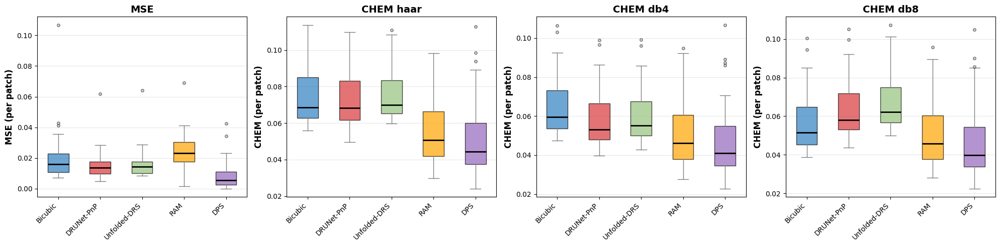

In [ ]:

# CELL 10 
# Create box plots for Rm distributions and MSE distributions across wavelets
print("\n" + "="*100)
print("CREATING BOX PLOTS FOR Rm AND MSE DISTRIBUTIONS (Across validation set)")
print("="*100)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Define colors to match pyramid plot (from fwhm_pyramid_plot.py for 'scales' mode)
model_colors = {
    'Bicubic': [47/255, 127/255, 193/255, 1.0],      # Blue
    'DRUNet-PnP': [216/255, 56/255, 58/255, 1.0],    # Red
    'Unfolded-DRS': [150/255, 195/255, 125/255, 1.0], # Green
    'RAM': [255/255, 165/255, 0/255, 1.0],           # Orange
    'DPS': [148/255, 103/255, 189/255, 1.0]          # Purple
}

# Column 0: MSE distribution
ax = axes[0]

# Prepare data for box plot - MSE values (one per patch) across validation set
mse_data = []
labels = []
box_colors = []

for model_name in models.keys():
    # Collect MSE values across validation set (same for all wavelets)
    mse_vals = np.array(hi_results[model_name][wavelets[0]]['mse_list'])
    mse_data.append(mse_vals)
    labels.append(f"{model_name}")
    box_colors.append(model_colors.get(model_name, [0.5, 0.5, 0.5, 1.0]))

# Create box plots with outliers shown
bp = ax.boxplot(mse_data, labels=labels, patch_artist=True,
                medianprops=dict(color='black', linewidth=2),
                whiskerprops=dict(color='gray'),
                capprops=dict(color='gray'),
                flierprops=dict(marker='o', markerfacecolor='darkgray', markersize=4, alpha=0.5),
                showfliers=True)

# Color each box according to model
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Rotate x-axis labels
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=10)

# Set labels and title
ax.set_ylabel('MSE (per patch)', fontsize=12, fontweight='bold')
ax.set_title('MSE', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')

# Columns 1-3: Rm distributions for each wavelet
for idx, wavelet in enumerate(wavelets):
    ax = axes[idx + 1]
    
    # Prepare data for box plot - Rm values (one per patch) across validation set
    rm_data = []
    labels = []
    box_colors = []
    
    for model_name in models.keys():
        # Collect Rm values (mean R per patch) across validation set
        rm_vals = np.array(hi_results[model_name][wavelet]['rm_list'])
        rm_data.append(rm_vals)
        labels.append(f"{model_name}")
        box_colors.append(model_colors.get(model_name, [0.5, 0.5, 0.5, 1.0]))
    
    # Create box plots with outliers shown
    bp = ax.boxplot(rm_data, labels=labels, patch_artist=True,
                    medianprops=dict(color='black', linewidth=2),
                    whiskerprops=dict(color='gray'),
                    capprops=dict(color='gray'),
                    flierprops=dict(marker='o', markerfacecolor='darkgray', markersize=4, alpha=0.5),
                    showfliers=True)
    
    # Color each box according to model
    for patch, color in zip(bp['boxes'], box_colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    # Rotate x-axis labels
    ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=10)
    
    # Set labels and title
    ax.set_ylabel('CHEM (per patch)', fontsize=12, fontweight='bold')
    ax.set_title(f'CHEM {wavelet.lower()}', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()

In [18]:
## Spatial Maps


LEVEL-BASED DECOMPOSITION VISUALIZATION

Loading butterfly example for level decomposition...

Decomposing prediction by frequency level:
  Model: DPS
  Wavelet: db8
  Image: butterfly.png

Number of decomposition levels: 4

Reconstructing individual levels:
  Level 1: coeff size (16, 16), reconstruction range [-0.415816, 0.395591], FINEST
  Level 2: coeff size (32, 32), reconstruction range [-0.344513, 0.324851], MEDIUM
  Level 3: coeff size (64, 64), reconstruction range [-0.318006, 0.237711], MEDIUM
  Level 4: coeff size (128, 128), reconstruction range [-0.299138, 0.260711], COARSEST


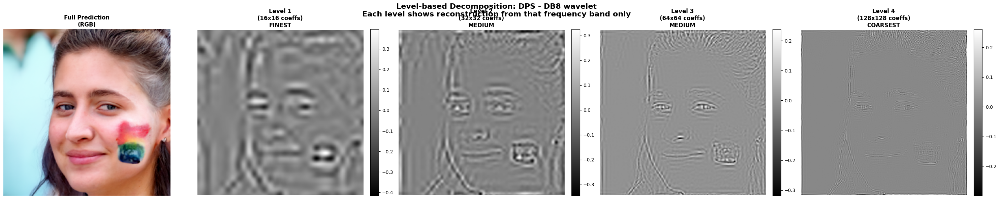

In [43]:
# Level-based Decomposition Visualization
print("\n" + "="*100)
print("LEVEL-BASED DECOMPOSITION VISUALIZATION")
print("="*100)

# Use the butterfly example image for visualization
print("\nLoading butterfly example for level decomposition...")
x_vis = dinv.utils.load_example("69037.png", device=device)  # RGB ground truth
y_vis = physics(x_vis)  # Noisy version

# Pick first model and first wavelet for visualization
vis_model = list(models.keys())[4] #DSP
vis_wavelet = wavelets[2] #db8

print(f"\nDecomposing prediction by frequency level:")
print(f"  Model: {vis_model}")
print(f"  Wavelet: {vis_wavelet}")
print(f"  Image: butterfly.png")

# Generate prediction
with torch.no_grad():
    if vis_model == 'Bicubic':
        pred_vis = models[vis_model](y_vis)
    else:
        pred_vis = models[vis_model](y_vis, physics)

# Extract Y-channel for decomposition
pred_y = pred_vis[0, 0].cpu().numpy()
pred_rgb = pred_vis[0].cpu().permute(1, 2, 0).numpy()  # [H, W, 3]

# Helper function to reconstruct image from specific level
def reconstruct_single_level(img, level_idx, wavelet='db8', mode='periodization'):
    """
    Reconstruct image from a single wavelet level
    
    Args:
        img: 2D grayscale image
        level_idx: Which level to reconstruct (0=finest, increasing for coarser)
        wavelet: Wavelet type
        mode: Wavelet mode
        
    Returns:
        Reconstructed image from that level only
    """
    # Perform full decomposition
    coeffs = pywt.wavedec2(img, wavelet, mode=mode)
    
    # Create filtered coefficients - zero LL and all details except target level
    filtered_coeffs = []
    
    # Zero out LL coefficients (we only want detail from specific level)
    filtered_coeffs.append(np.zeros_like(coeffs[0]))
    
    # Zero out all detail levels except the target
    for detail_idx, (cH, cV, cD) in enumerate(coeffs[1:]):
        if detail_idx == level_idx:
            # Keep this level
            filtered_coeffs.append((cH, cV, cD))
        else:
            # Zero out this level
            filtered_coeffs.append((np.zeros_like(cH), np.zeros_like(cV), np.zeros_like(cD)))
    
    # Reconstruct
    recon = pywt.waverec2(filtered_coeffs, wavelet, mode=mode)
    return recon[:img.shape[0], :img.shape[1]]

# Compute wavelet decomposition
coeffs_2d = pywt.wavedec2(pred_y, vis_wavelet, mode='periodization')
coeffs_2d_detail = coeffs_2d[1:]
n_levels = len(coeffs_2d_detail)

print(f"\nNumber of decomposition levels: {n_levels}")

# Create figure: 1 row x (1 original + n_levels)
fig, axes = plt.subplots(1, n_levels + 1, figsize=(6*(n_levels+1), 6))

# Column 0: Original RGB prediction
axes[0].imshow(np.clip(pred_rgb, 0, 1))
axes[0].set_title(f'Full Prediction\n(RGB)', 
                  fontsize=12, fontweight='bold')
axes[0].axis('off')

# Columns 1+: Level reconstructions
print("\nReconstructing individual levels:")
for level_idx in range(n_levels):
    level_recon = reconstruct_single_level(pred_y, level_idx, vis_wavelet, 'periodization')
    
    # Get level coefficient shape
    cH, cV, cD = coeffs_2d_detail[level_idx]
    coeff_shape = cD.shape
    
    # Determine frequency label
    freq_label = 'FINEST' if level_idx == 0 else 'COARSEST' if level_idx == n_levels-1 else 'MEDIUM'
    
    im = axes[level_idx + 1].imshow(level_recon, cmap='gray', vmin=level_recon.min(), vmax=level_recon.max())
    axes[level_idx + 1].set_title(f'Level {level_idx + 1}\n({coeff_shape[0]}x{coeff_shape[1]} coeffs)\n{freq_label}', 
                                  fontsize=12, fontweight='bold')
    axes[level_idx + 1].axis('off')
    plt.colorbar(im, ax=axes[level_idx + 1], fraction=0.046, pad=0.04)
    
    print(f"  Level {level_idx + 1}: coeff size {coeff_shape}, "
          f"reconstruction range [{level_recon.min():.6f}, {level_recon.max():.6f}], {freq_label}")

plt.suptitle(f'Level-based Decomposition: {vis_model} - {vis_wavelet.upper()} wavelet\n'
             f'Each level shows reconstruction from that frequency band only',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()



LEVEL-WISE SPATIAL VISUALIZATION (RGB)

Creating comprehensive spatial analysis for:
  Model: DPS
  Wavelet: db8
  Image: butterfly.png

Creating level-wise decomposition and maps...
  Level 1:
    MSE map range: [-0.331767, 0.305201]
    R-value map range: [-2.765707, 2.761500]
  Level 2:
    MSE map range: [-0.405576, 0.380669]
    R-value map range: [-3.833166, 4.213226]
  Level 3:
    MSE map range: [-0.155470, 0.165167]
    R-value map range: [-4.149013, 4.238172]
  Level 4:
    MSE map range: [-0.121396, 0.112043]
    R-value map range: [-3.909230, 3.910007]


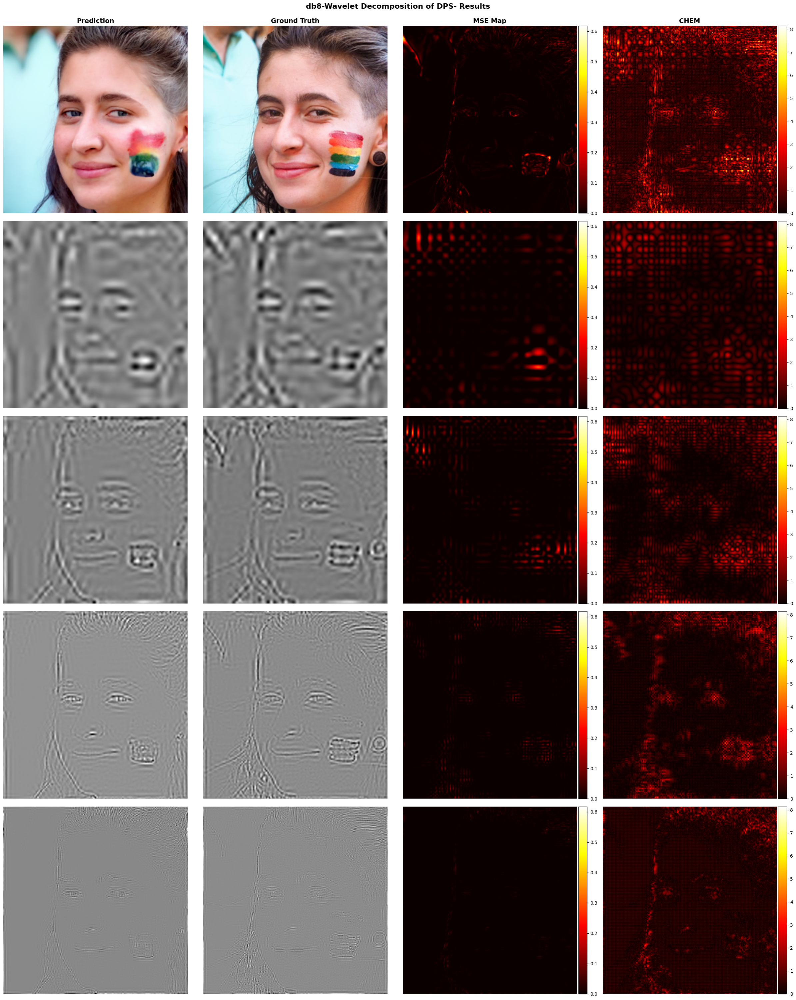


Level-wise spatial map analysis complete!


In [64]:
# Level-wise Spatial Visualization (RGB version with comprehensive maps)
print("\n" + "="*100)
print("LEVEL-WISE SPATIAL VISUALIZATION (RGB)")
print("="*100)

print(f"\nCreating comprehensive spatial analysis for:")
print(f"  Model: {vis_model}")
print(f"  Wavelet: {vis_wavelet}")
print(f"  Image: butterfly.png")

# Compute hallucination index on Y-channel (for R-values)
Hmeasure = Wavelet_Hallucination_Index(alpha, theta, vis_wavelet)
Hmeasure.to(device)
Hmeasure.eval()

# Use the butterfly's actual interval radius if available, otherwise use uniform
if vis_model in interval_radii:
    # Resize interval radius to match butterfly image size
    interval_radius_vis = np.ones((x_vis.shape[2], x_vis.shape[3])) * interval_radii[vis_model].mean()
else:
    interval_radius_vis = np.ones((x_vis.shape[2], x_vis.shape[3])) * 0.05

interval_radius_tensor = torch.tensor(interval_radius_vis, dtype=torch.float32).to(device)

with torch.no_grad():
    hi, R, rm, rd = Hmeasure(x_vis, pred_vis, interval_radius_tensor, debug=False)

# Extract Y-channel for R-value and MSE analysis
target_y = x_vis[0, 0].cpu().numpy()
R_values_flat = R[0, 0, :].cpu().numpy()

# Extract RGB for visualization
target_rgb = x_vis[0].cpu().permute(1, 2, 0).numpy()  # [H, W, 3]

# Build band_info (order: HL, LH, HH, matching image_to_wavelet_coeffs)
band_info = []
flat_idx = 0

for level_idx, (cH, cV, cD) in enumerate(coeffs_2d_detail):
    level_info = {
        'level': level_idx,
        'HL': {'shape': cH.shape, 'start_idx': flat_idx, 'end_idx': flat_idx + cH.size},
        'LH': {'shape': cV.shape, 'start_idx': flat_idx + cH.size, 'end_idx': flat_idx + cH.size + cV.size},
        'HH': {'shape': cD.shape, 'start_idx': flat_idx + cH.size + cV.size, 'end_idx': flat_idx + cD.size + cH.size + cV.size}
    }
    flat_idx += cD.size + cH.size + cV.size
    band_info.append(level_info)

# Helper function to create full spatial R-value map
def create_r_value_spatial_map(R_values_flat, band_info, target_shape, wavelet='db8'):
    """Create a 2D spatial map of R-values by reconstructing from coefficients"""
    r_coeffs = []
    
    # LL coefficients - zero since they're not in our R-values
    first_detail_size = band_info[0]['HH']['shape'][0]
    r_coeffs.append(np.zeros((first_detail_size, first_detail_size)))
    
    # Fill detail coefficients with R-values (in PyWavelets order: cH, cV, cD = HL, LH, HH)
    for level_info in band_info:
        hl_r = R_values_flat[level_info['HL']['start_idx']:level_info['HL']['end_idx']].reshape(level_info['HL']['shape'])
        lh_r = R_values_flat[level_info['LH']['start_idx']:level_info['LH']['end_idx']].reshape(level_info['LH']['shape'])
        hh_r = R_values_flat[level_info['HH']['start_idx']:level_info['HH']['end_idx']].reshape(level_info['HH']['shape'])
        
        r_coeffs.append((hl_r, lh_r, hh_r))  # pywt uses (cH, cV, cD) order
    
    # Reconstruct to get spatial R-value map
    r_map = pywt.waverec2(r_coeffs, wavelet, mode='periodization')
    r_map = r_map[:target_shape[0], :target_shape[1]]
    
    return r_map

# Helper function to create spatial maps for a specific level
def create_level_spatial_maps(prediction_y, target_y, R_values_flat, level_idx, band_info, wavelet='db8'):
    """Create MSE and R-value spatial maps for a specific wavelet level"""
    # Compute wavelet coefficients for prediction and target
    pred_coeffs = pywt.wavedec2(prediction_y, wavelet, mode='periodization')
    target_coeffs = pywt.wavedec2(target_y, wavelet, mode='periodization')
    
    # Create MSE map from coefficients at this level
    mse_coeffs = []
    mse_coeffs.append(np.zeros_like(pred_coeffs[0]))  # Zero LL
    
    for detail_idx, ((cH_p, cV_p, cD_p), (cH_t, cV_t, cD_t)) in enumerate(zip(pred_coeffs[1:], target_coeffs[1:])):
        if detail_idx == level_idx:
            # Compute MSE for this level
            mse_cH = (cH_p - cH_t) ** 2
            mse_cV = (cV_p - cV_t) ** 2
            mse_cD = (cD_p - cD_t) ** 2
            mse_coeffs.append((mse_cH, mse_cV, mse_cD))
        else:
            # Zero out other levels
            mse_coeffs.append((np.zeros_like(cH_p), np.zeros_like(cV_p), np.zeros_like(cD_p)))
    
    # Reconstruct MSE map
    mse_map = pywt.waverec2(mse_coeffs, wavelet, mode='periodization')
    mse_map = mse_map[:prediction_y.shape[0], :prediction_y.shape[1]]
    
    # Create R-value map from coefficients at this level
    r_coeffs = []
    
    # Zero LL
    first_detail_size = band_info[0]['HH']['shape'][0]
    r_coeffs.append(np.zeros((first_detail_size, first_detail_size)))
    
    # Fill only the target level with R-values
    for level_idx_iter, level_info_iter in enumerate(band_info):
        if level_idx_iter == level_idx:
            hl_r = R_values_flat[level_info_iter['HL']['start_idx']:level_info_iter['HL']['end_idx']].reshape(level_info_iter['HL']['shape'])
            lh_r = R_values_flat[level_info_iter['LH']['start_idx']:level_info_iter['LH']['end_idx']].reshape(level_info_iter['LH']['shape'])
            hh_r = R_values_flat[level_info_iter['HH']['start_idx']:level_info_iter['HH']['end_idx']].reshape(level_info_iter['HH']['shape'])
            
            r_coeffs.append((hl_r, lh_r, hh_r))
        else:
            dummy_shape = level_info_iter['HH']['shape']
            r_coeffs.append((np.zeros(dummy_shape), np.zeros(dummy_shape), np.zeros(dummy_shape)))
    
    # Reconstruct R-value map
    r_map = pywt.waverec2(r_coeffs, wavelet, mode='periodization')
    r_map = r_map[:prediction_y.shape[0], :prediction_y.shape[1]]
    
    return mse_map, r_map

# Helper function to reconstruct image from specific level
def reconstruct_single_level(img, level_idx, wavelet='db8', mode='periodization'):
    """Reconstruct image from a single wavelet level"""
    coeffs = pywt.wavedec2(img, wavelet, mode=mode)
    
    # Create filtered coefficients - zero LL and all details except target level
    filtered_coeffs = []
    filtered_coeffs.append(np.zeros_like(coeffs[0]))
    
    # Zero out all detail levels except the target
    for detail_idx, (cH, cV, cD) in enumerate(coeffs[1:]):
        if detail_idx == level_idx:
            filtered_coeffs.append((cH, cV, cD))
        else:
            filtered_coeffs.append((np.zeros_like(cH), np.zeros_like(cV), np.zeros_like(cD)))
    
    # Reconstruct
    recon = pywt.waverec2(filtered_coeffs, wavelet, mode=mode)
    return recon[:img.shape[0], :img.shape[1]]

# Compute full MSE map (Y-channel)
mse_map_full = (pred_y - target_y) ** 2

# Compute PSNR for display
psnr_val = dinv.metric.PSNR()(pred_vis, x_vis).item()

# Create figure: (n_levels + 1) rows x 4 columns
# Columns: Level Decomposition | Target Decomposition | MSE Map | CHEM Map (|R|)
fig, axes = plt.subplots(n_levels + 1, 4, figsize=(24, 6*(n_levels + 1)))

# ROW 0: Full images
# Column 0: Full Prediction (RGB)
axes[0, 0].imshow(np.clip(pred_rgb, 0, 1), aspect='auto')
axes[0, 0].set_title(f'Prediction', 
                     fontsize=14, fontweight='bold')
axes[0, 0].axis('off')

# Column 1: Full Target (RGB)
axes[0, 1].imshow(np.clip(target_rgb, 0, 1), aspect='auto')
axes[0, 1].set_title(f'Ground Truth', 
                     fontsize=14, fontweight='bold')
axes[0, 1].axis('off')

# Column 2: Full MSE map (Y-channel)
im02 = axes[0, 2].imshow(mse_map_full, cmap='hot', vmin=0, vmax=mse_map_full.max(), aspect='auto')
axes[0, 2].set_title(f'MSE Map', 
                     fontsize=14, fontweight='bold')
axes[0, 2].axis('off')
# Use axes parameter to prevent shrinking
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider02 = make_axes_locatable(axes[0, 2])
cax02 = divider02.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im02, cax=cax02)

# Column 3: Full R-value map (absolute value)
r_value_map_full = create_r_value_spatial_map(R_values_flat, band_info, pred_y.shape, vis_wavelet)
im03 = axes[0, 3].imshow(np.abs(r_value_map_full), cmap='hot', vmin=0, vmax=np.abs(r_value_map_full).max(), aspect='auto')
axes[0, 3].set_title(f'CHEM', 
                     fontsize=14, fontweight='bold')
axes[0, 3].axis('off')
divider03 = make_axes_locatable(axes[0, 3])
cax03 = divider03.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im03, cax=cax03)

# ROWS 1+: Level-wise breakdown
print("\nCreating level-wise decomposition and maps...")

for level_idx in range(n_levels):
    row_idx = level_idx + 1
    level_info = band_info[level_idx]
    
    # Determine frequency label
    freq_label = 'FINEST' if level_idx == 0 else 'COARSEST' if level_idx == n_levels-1 else 'MEDIUM'
    
    # Column 0: Prediction decomposed at this level
    pred_level_recon = reconstruct_single_level(pred_y, level_idx, vis_wavelet, 'periodization')
    im0 = axes[row_idx, 0].imshow(pred_level_recon, cmap='gray', 
                                  vmin=pred_level_recon.min(), vmax=pred_level_recon.max(), aspect='auto')
    axes[row_idx, 0].set_title(f'', 
                               fontsize=12, fontweight='bold')
    axes[row_idx, 0].axis('off')
    
    # Column 1: Target decomposed at this level
    target_level_recon = reconstruct_single_level(target_y, level_idx, vis_wavelet, 'periodization')
    im1 = axes[row_idx, 1].imshow(target_level_recon, cmap='gray',
                                  vmin=target_level_recon.min(), vmax=target_level_recon.max(), aspect='auto')
    axes[row_idx, 1].set_title(f'', 
                               fontsize=12, fontweight='bold')
    axes[row_idx, 1].axis('off')
    
    # Create spatial maps for this level
    mse_map_level, r_map_level = create_level_spatial_maps(
        pred_y, target_y, R_values_flat, level_idx, band_info, vis_wavelet
    )
    
    print(f"  Level {level_idx + 1}:")
    print(f"    MSE map range: [{mse_map_level.min():.6f}, {mse_map_level.max():.6f}]")
    print(f"    R-value map range: [{r_map_level.min():.6f}, {r_map_level.max():.6f}]")
    
    # Column 2: MSE map for this level
    im2 = axes[row_idx, 2].imshow(mse_map_level, cmap='hot', vmin=0, vmax=mse_map_full.max(), aspect='auto')
    axes[row_idx, 2].set_title(f'', 
                               fontsize=12, fontweight='bold')
    axes[row_idx, 2].axis('off')
    divider2 = make_axes_locatable(axes[row_idx, 2])
    cax2 = divider2.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im2, cax=cax2)
    
    # Column 3: CHEM map (absolute value of R) for this level
    im3 = axes[row_idx, 3].imshow(np.abs(r_map_level), cmap='hot', 
                                  vmin=0, vmax=np.abs(r_value_map_full).max(), aspect='auto')
    axes[row_idx, 3].set_title(f'', 
                               fontsize=12, fontweight='bold')
    axes[row_idx, 3].axis('off')
    divider3 = make_axes_locatable(axes[row_idx, 3])
    cax3 = divider3.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im3, cax=cax3)

plt.suptitle(f'{vis_wavelet.lower()}-Wavelet Decomposition of {vis_model}- Results',
             fontsize=16, fontweight='bold', y=0.998)
plt.tight_layout()
plt.show()

print("\nLevel-wise spatial map analysis complete!")


LEVEL-WISE SPATIAL VISUALIZATION WITH R-VALUE OVERLAY

Creating comprehensive spatial analysis with overlay for:
  Model: DPS
  Wavelet: db8
  Image: butterfly.png

Creating level-wise spatial maps with overlay...
  Level 1:
    MSE map range: [-0.331767, 0.305201]
    R-value map range: [-2.765707, 2.761500]
  Level 2:
    MSE map range: [-0.405576, 0.380669]
    R-value map range: [-3.833166, 4.213226]
  Level 3:
    MSE map range: [-0.155470, 0.165167]
    R-value map range: [-4.149013, 4.238172]
  Level 4:
    MSE map range: [-0.121396, 0.112043]
    R-value map range: [-3.909230, 3.910007]


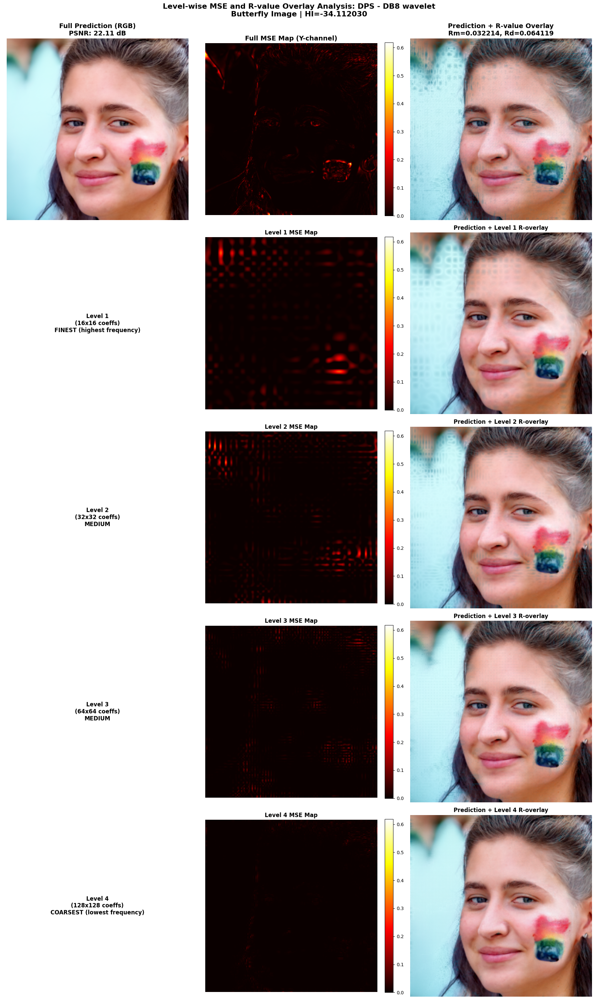


Level-wise spatial map analysis with overlay complete!


In [45]:
# Level-wise Spatial Visualization with R-value Overlay on Prediction
print("\n" + "="*100)
print("LEVEL-WISE SPATIAL VISUALIZATION WITH R-VALUE OVERLAY")
print("="*100)

print(f"\nCreating comprehensive spatial analysis with overlay for:")
print(f"  Model: {vis_model}")
print(f"  Wavelet: {vis_wavelet}")
print(f"  Image: butterfly.png")

# Compute full MSE map (Y-channel)
mse_map_full = (pred_y - target_y) ** 2

# Prepare pred_rgb for display
pred_rgb_display = np.clip(pred_rgb, 0, 1)

# Compute PSNR for display
psnr_val = dinv.metric.PSNR()(pred_vis, x_vis).item()

# Create figure: (n_levels + 1) rows x 3 columns
fig, axes = plt.subplots(n_levels + 1, 3, figsize=(18, 6*(n_levels + 1)))

# ROW 0: Full RGB prediction, full MSE, prediction with full R-value overlay
# Column 0: Full Prediction (RGB)
axes[0, 0].imshow(pred_rgb_display)
axes[0, 0].set_title(f'Full Prediction (RGB)\nPSNR: {psnr_val:.2f} dB', 
                     fontsize=14, fontweight='bold')
axes[0, 0].axis('off')

# Column 1: Full MSE map (Y-channel)
im01 = axes[0, 1].imshow(mse_map_full, cmap='hot', vmin=0, vmax=mse_map_full.max())
axes[0, 1].set_title(f'Full MSE Map (Y-channel)', 
                     fontsize=14, fontweight='bold')
axes[0, 1].axis('off')
plt.colorbar(im01, ax=axes[0, 1], fraction=0.046, pad=0.04)

# Column 2: Prediction with full R-value overlay
axes[0, 2].imshow(pred_rgb_display)

# Create overlay for R-values
vmax_r_full = max(abs(r_value_map_full.min()), abs(r_value_map_full.max()))
if vmax_r_full > 1e-10:
    # Normalize R-values to [0, 1] for visualization
    r_normalized = np.abs(r_value_map_full) / vmax_r_full
    
    # Create RGBA overlay (bright cyan/blue with stronger alpha)
    overlay = np.zeros((*r_value_map_full.shape, 4))
    overlay[:, :, 0] = 0.0  # Red
    overlay[:, :, 1] = 0.4  # Green (adding some green makes it cyan, use 0.0 for pure blue)
    overlay[:, :, 2] = 0.5 # Blue
    overlay[:, :, 3] = r_normalized * 0.99  # Alpha varies with R-value magnitude (max 80%, stronger)
    
    axes[0, 2].imshow(overlay, interpolation='bilinear')

axes[0, 2].set_title(f'Prediction + R-value Overlay\nRm={rm.item():.6f}, Rd={rd.item():.6f}', 
                     fontsize=14, fontweight='bold')
axes[0, 2].axis('off')

# ROWS 1+: Level-wise breakdown
print("\nCreating level-wise spatial maps with overlay...")

for level_idx in range(n_levels):
    row_idx = level_idx + 1  # Offset by 1 because row 0 is full maps
    level_info = band_info[level_idx]
    
    # Column 0: Level info text
    axes[row_idx, 0].axis('off')
    freq_label = 'FINEST (highest frequency)' if level_idx == 0 else 'COARSEST (lowest frequency)' if level_idx == n_levels-1 else 'MEDIUM'
    axes[row_idx, 0].text(0.5, 0.5, f'Level {level_idx + 1}\n({level_info["HH"]["shape"][0]}x{level_info["HH"]["shape"][1]} coeffs)\n{freq_label}', 
                          ha='center', va='center', transform=axes[row_idx, 0].transAxes,
                          fontsize=12, fontweight='bold')
    
    # Create spatial maps for this level
    mse_map_level, r_map_level = create_level_spatial_maps(
        pred_y, target_y, R_values_flat, level_idx, band_info, vis_wavelet
    )
    
    print(f"  Level {level_idx + 1}:")
    print(f"    MSE map range: [{mse_map_level.min():.6f}, {mse_map_level.max():.6f}]")
    print(f"    R-value map range: [{r_map_level.min():.6f}, {r_map_level.max():.6f}]")
    
    # Column 1: MSE map for this level
    im1 = axes[row_idx, 1].imshow(mse_map_level, cmap='hot', vmin=0, vmax=mse_map_full.max())
    axes[row_idx, 1].set_title(f'Level {level_idx + 1} MSE Map', 
                                fontsize=12, fontweight='bold')
    axes[row_idx, 1].axis('off')
    plt.colorbar(im1, ax=axes[row_idx, 1], fraction=0.046, pad=0.04)
    
    # Column 2: Prediction with R-value overlay for this level
    axes[row_idx, 2].imshow(pred_rgb_display)
    
    # Create overlay for this level's R-values
    if vmax_r_full > 1e-10:
        # Normalize R-values to [0, 1]
        r_normalized_level = np.abs(r_map_level) / vmax_r_full
        
        # Create RGBA overlay (bright cyan/blue with stronger alpha)
        overlay_level = np.zeros((*r_map_level.shape, 4))
        overlay_level[:, :, 0] = 0.0  # Red
        overlay_level[:, :, 1] = 0.4  # Green (use 0.0 for pure blue)
        overlay_level[:, :, 2] = 0.5  # Blue
        overlay_level[:, :, 3] = r_normalized_level * 0.99  # Alpha varies with R-value magnitude
        
        axes[row_idx, 2].imshow(overlay_level, interpolation='bilinear')
    
    axes[row_idx, 2].set_title(f'Prediction + Level {level_idx + 1} R-overlay', 
                                fontsize=12, fontweight='bold')
    axes[row_idx, 2].axis('off')

plt.suptitle(f'Level-wise MSE and R-value Overlay Analysis: {vis_model} - {vis_wavelet.upper()} wavelet\n'
             f'Butterfly Image | HI={hi.item():.6f}',
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

print("\nLevel-wise spatial map analysis with overlay complete!")

In [22]:
### Highest Hallucination in Level n and n-1 spatial map



COMBINED ANALYSIS WITH ZOOM-IN: FULL MSE + COARSEST TWO LEVELS HIGH CHEM

Calculating global threshold for CHEM (coarsest two levels only)...
Global R-value statistics for coarsest two levels:
  Mean: -0.117672
  Std:  0.702063
  Global Threshold (mean + 1.5*std): 0.795010
  Min:  -0.502397
  Max:  13.141966

--------------------------------------------------------------------------------
Processing coarsest two levels for CHEM...

  Processing Level 3:
    Coefficient shape: (64, 64)
    Coefficients above threshold: 2058 (16.7%)
    Added CHEM highlights to combined map

  Processing Level 4:
    Coefficient shape: (128, 128)
    Coefficients above threshold: 2167 (4.4%)
    Added CHEM highlights to combined map

--------------------------------------------------------------------------------
Combined maps created!
  CHEM map: high values from levels 3 and 4 only

Zoom region: top right corner (70:146, 120:196)


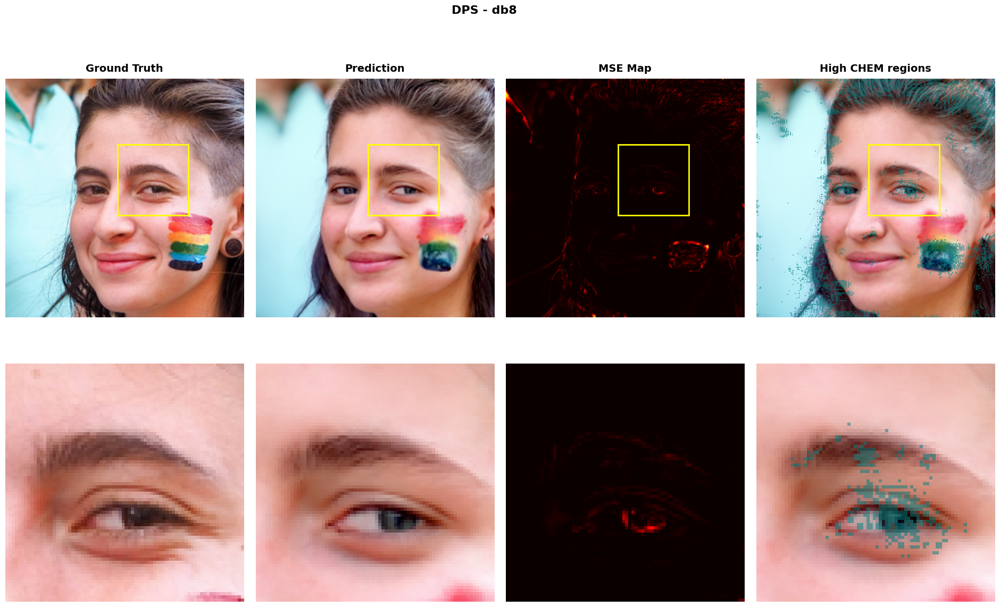


Combined analysis with zoom complete!


In [70]:

# Focused Analysis: Full MSE + High CHEM from coarsest two levels + Zoom-ins
print("\n" + "="*100)
print("COMBINED ANALYSIS WITH ZOOM-IN: FULL MSE + COARSEST TWO LEVELS HIGH CHEM")
print("="*100)

# Identify the coarsest two levels for CHEM analysis
coarsest_level_idx = n_levels - 1
second_coarsest_level_idx = n_levels - 2

levels_to_analyze_chem = [
    (second_coarsest_level_idx, "Second-Coarsest"),
    (coarsest_level_idx, "Coarsest")
]

# Calculate global threshold across both coarsest levels (for CHEM)
print("\nCalculating global threshold for CHEM (coarsest two levels only)...")
all_r_both_levels = []
for level_idx, _ in levels_to_analyze_chem:
    level_info = band_info[level_idx]
    hl_r = R_values_flat[level_info['HL']['start_idx']:level_info['HL']['end_idx']].reshape(level_info['HL']['shape'])
    lh_r = R_values_flat[level_info['LH']['start_idx']:level_info['LH']['end_idx']].reshape(level_info['LH']['shape'])
    hh_r = R_values_flat[level_info['HH']['start_idx']:level_info['HH']['end_idx']].reshape(level_info['HH']['shape'])
    all_r_both_levels.extend([hl_r.flatten(), lh_r.flatten(), hh_r.flatten()])

all_r_both_levels = np.concatenate(all_r_both_levels)
global_threshold = all_r_both_levels.mean() + 1.3 * all_r_both_levels.std()

print(f"Global R-value statistics for coarsest two levels:")
print(f"  Mean: {all_r_both_levels.mean():.6f}")
print(f"  Std:  {all_r_both_levels.std():.6f}")
print(f"  Global Threshold (mean + 1.5*std): {global_threshold:.6f}")
print(f"  Min:  {all_r_both_levels.min():.6f}")
print(f"  Max:  {all_r_both_levels.max():.6f}")

# Create spatial maps for COARSEST TWO LEVELS (CHEM)
from scipy.ndimage import zoom

print(f"\n{'-'*80}")
print("Processing coarsest two levels for CHEM...")

# Initialize combined CHEM map (will only accumulate coarsest two levels)
combined_chem_highlighted = None
combined_pct_above = 0

# Process each level
for level_idx in range(n_levels):
    level_info = band_info[level_idx]
    
    # For CHEM: only process coarsest two levels
    if level_idx in [second_coarsest_level_idx, coarsest_level_idx]:
        print(f"\n  Processing Level {level_idx + 1}:")
        print(f"    Coefficient shape: {level_info['HH']['shape']}")
        
        # Create spatial maps for this level
        mse_map_level, r_map_level = create_level_spatial_maps(
            pred_y, target_y, R_values_flat, level_idx, band_info, vis_wavelet
        )
        
        # Extract R-values for this level
        hl_r = R_values_flat[level_info['HL']['start_idx']:level_info['HL']['end_idx']].reshape(level_info['HL']['shape'])
        lh_r = R_values_flat[level_info['LH']['start_idx']:level_info['LH']['end_idx']].reshape(level_info['LH']['shape'])
        hh_r = R_values_flat[level_info['HH']['start_idx']:level_info['HH']['end_idx']].reshape(level_info['HH']['shape'])
        
        all_r_level = np.concatenate([hl_r.flatten(), lh_r.flatten(), hh_r.flatten()])
        
        # Count values above threshold
        n_above_threshold = np.sum(np.abs(all_r_level) > global_threshold)
        pct_above_threshold = n_above_threshold / len(all_r_level) * 100
        print(f"    Coefficients above threshold: {n_above_threshold} ({pct_above_threshold:.1f}%)")
        
        # Create highlight mask for high CHEM values
        highlight_mask = np.abs(r_map_level) > global_threshold
        r_map_highlighted = np.copy(r_map_level)
        r_map_highlighted[~highlight_mask] = 0  # Zero out values below threshold
        
        # Upsample to full size
        original_shape = pred_y.shape
        zoom_factors = (original_shape[0] / r_map_highlighted.shape[0], 
                       original_shape[1] / r_map_highlighted.shape[1])
        r_map_highlighted_fullsize = zoom(r_map_highlighted, zoom_factors, order=1)
        
        # Accumulate CHEM highlights
        if combined_chem_highlighted is None:
            combined_chem_highlighted = r_map_highlighted_fullsize
        else:
            combined_chem_highlighted = combined_chem_highlighted + r_map_highlighted_fullsize
        
        combined_pct_above += pct_above_threshold
        print(f"    Added CHEM highlights to combined map")

# Average the percentage
if second_coarsest_level_idx >= 0 and coarsest_level_idx >= 0:
    combined_pct_above = combined_pct_above / 2

print(f"\n{'-'*80}")
print("Combined maps created!")
print(f"  CHEM map: high values from levels {second_coarsest_level_idx + 1} and {coarsest_level_idx + 1} only")

# Compute full MSE map
mse_map_full = (pred_y - target_y) ** 2

# Prepare RGB images for visualization
gt_rgb = target_rgb  # Already in [H, W, 3] format
pred_rgb_display = pred_rgb  # Already in [H, W, 3] format

# Clip to [0, 1] range for display
gt_rgb = np.clip(gt_rgb, 0, 1)
pred_rgb_display = np.clip(pred_rgb_display, 0, 1)

# Define zoom region (center - adjust size as needed)
h, w = pred_y.shape
zoom_size = int(min(h, w) * 0.3)  # 30% of image size
zoom_y_start = (h - zoom_size) // 2 -20
zoom_y_end = zoom_y_start + zoom_size
zoom_x_start = (w - zoom_size) // 2 +30
zoom_x_end = zoom_x_start + zoom_size

print(f"\nZoom region: top right corner ({zoom_y_start}:{zoom_y_end}, {zoom_x_start}:{zoom_x_end})")

# Create figure with 2 rows x 4 columns: full images on top, zooms on bottom
# Add extra vertical spacing between rows
fig = plt.figure(figsize=(24, 13))
gs = fig.add_gridspec(2, 4, hspace=0.15, wspace=0.05)

# Create axes manually for better control
axes = []
for i in range(2):
    row_axes = []
    for j in range(4):
        row_axes.append(fig.add_subplot(gs[i, j]))
    axes.append(row_axes)

# Convert to numpy array for easier indexing
axes = np.array(axes)

# ===== ROW 0: Full images =====

# Column 0: Ground Truth (RGB)
axes[0, 0].imshow(gt_rgb)
axes[0, 0].set_title('Ground Truth', fontsize=14, fontweight='bold', pad=10)
axes[0, 0].axis('off')
# Add rectangle to show zoom region
from matplotlib.patches import Rectangle
rect0 = Rectangle((zoom_x_start, zoom_y_start), zoom_size, zoom_size, 
                  linewidth=2, edgecolor='yellow', facecolor='none')
axes[0, 0].add_patch(rect0)

# Column 1: Prediction (RGB)
axes[0, 1].imshow(pred_rgb_display)
axes[0, 1].set_title('Prediction', fontsize=14, fontweight='bold', pad=10)
axes[0, 1].axis('off')
rect1 = Rectangle((zoom_x_start, zoom_y_start), zoom_size, zoom_size, 
                  linewidth=2, edgecolor='yellow', facecolor='none')
axes[0, 1].add_patch(rect1)

# Column 2: Full MSE map
im2 = axes[0, 2].imshow(mse_map_full, cmap='hot', vmin=0, vmax=mse_map_full.max())
axes[0, 2].set_title('MSE Map', fontsize=14, fontweight='bold', pad=10)
axes[0, 2].axis('off')
#plt.colorbar(im2, ax=axes[0, 2], fraction=0.03, pad=0.02, aspect=30)
rect2 = Rectangle((zoom_x_start, zoom_y_start), zoom_size, zoom_size, 
                  linewidth=2, edgecolor='yellow', facecolor='none')
axes[0, 2].add_patch(rect2)

# Column 3: Prediction with translucent overlay of high CHEM regions
axes[0, 3].imshow(pred_rgb_display)

if combined_chem_highlighted is not None:
    high_chem_mask = np.abs(combined_chem_highlighted) > 1e-10
    
    overlay = np.zeros((*high_chem_mask.shape, 4))  # RGBA
    overlay[high_chem_mask, 0] = 0.0  # Red
    overlay[high_chem_mask, 1] = 0.5  # Green
    overlay[high_chem_mask, 2] = 0.5  # Blue (cyan)
    overlay[high_chem_mask, 3] = 0.5  # Alpha
    
    axes[0, 3].imshow(overlay, interpolation='nearest')

axes[0, 3].set_title('High CHEM regions', 
                     fontsize=14, fontweight='bold', pad=10)
axes[0, 3].axis('off')
rect3 = Rectangle((zoom_x_start, zoom_y_start), zoom_size, zoom_size, 
                  linewidth=2, edgecolor='yellow', facecolor='none')
axes[0, 3].add_patch(rect3)

# ===== ROW 1: Zoom-ins of top right corner (NO TITLES) =====

# Zoom 0: Ground Truth
gt_zoom = gt_rgb[zoom_y_start:zoom_y_end, zoom_x_start:zoom_x_end]
axes[1, 0].imshow(gt_zoom)
axes[1, 0].axis('off')

# Zoom 1: Prediction
pred_zoom = pred_rgb_display[zoom_y_start:zoom_y_end, zoom_x_start:zoom_x_end]
axes[1, 1].imshow(pred_zoom)
axes[1, 1].axis('off')

# Zoom 2: MSE
mse_zoom = mse_map_full[zoom_y_start:zoom_y_end, zoom_x_start:zoom_x_end]
im_mse_zoom = axes[1, 2].imshow(mse_zoom, cmap='hot', vmin=0, vmax=mse_map_full.max())
axes[1, 2].axis('off')
#plt.colorbar(im_mse_zoom, ax=axes[1, 2], fraction=0.03, pad=0.02, aspect=30)

# Zoom 3: Prediction with overlay
axes[1, 3].imshow(pred_zoom)

if combined_chem_highlighted is not None:
    overlay_zoom = overlay[zoom_y_start:zoom_y_end, zoom_x_start:zoom_x_end]
    axes[1, 3].imshow(overlay_zoom, interpolation='nearest')

axes[1, 3].axis('off')

# Main title (only model name and wavelet)
plt.suptitle(f'{vis_model} - {vis_wavelet}', 
             fontsize=16, fontweight='bold', y=0.98)
plt.show()

print("\n" + "="*100)
print("Combined analysis with zoom complete!")
print("="*100)


SPATIALLY REGULARIZED CHEM ANALYSIS

Applying spatial regularization to CHEM maps:
  Model: DPS
  Wavelet: db8
  Image: butterfly.png

Applying spatial regularization to full R-value map...
  Regularizing CHEM map with spatial penalties...
    Lambda1 (sparsity): 0.05
    Lambda2 (spatial): 10
    Max iterations: 50
    Running optimization...
    Optimization converged: False
    Final objective value: 284800.775977
    Original non-zero pixels: 65536
    Regularized non-zero pixels: 65536
    Sparsity improvement: 0.0%

Regularized map statistics:
  Range: [-4.207225, 5.392017]
  Mean: 0.000000
  Std: 0.650805

Generating comparison visualization...


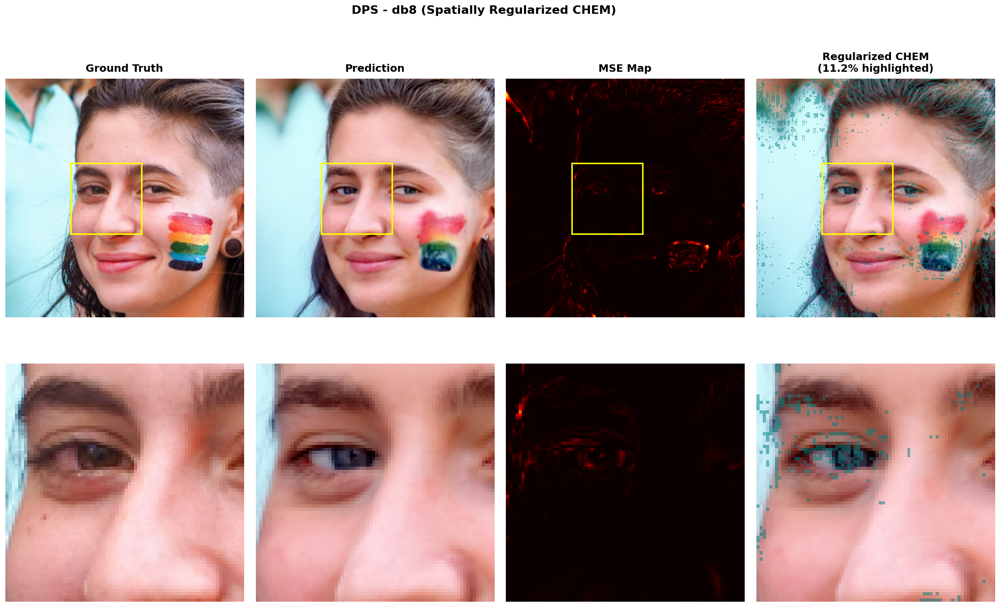


Spatially regularized CHEM analysis complete!


In [56]:
# Spatially Regularized CHEM Maps
print("\n" + "="*100)
print("SPATIALLY REGULARIZED CHEM ANALYSIS")
print("="*100)

print(f"\nApplying spatial regularization to CHEM maps:")
print(f"  Model: {vis_model}")
print(f"  Wavelet: {vis_wavelet}")
print(f"  Image: butterfly.png")

# Optimization-based spatial regularization for CHEM map
def spatially_regularize_chem_map(r_map, wavelet='db8', lambda1=0.1, lambda2=0.5, max_iter=100):
    """
    Optimize CHEM map with spatial regularization using wavelet sparsity and spatial penalty.
    
    Similar to ShearletX optimization:
    - lambda1: sparsity penalty (encourages fewer active regions)
    - lambda2: spatial energy penalty (encourages spatial coherence)
    
    Args:
        r_map: Original R-value spatial map (2D numpy array)
        wavelet: Wavelet type for decomposition
        lambda1: Sparsity regularization weight
        lambda2: Spatial penalty weight
        max_iter: Number of optimization iterations
        
    Returns:
        Regularized CHEM map
    """
    from scipy.optimize import minimize
    
    print(f"  Regularizing CHEM map with spatial penalties...")
    print(f"    Lambda1 (sparsity): {lambda1}")
    print(f"    Lambda2 (spatial): {lambda2}")
    print(f"    Max iterations: {max_iter}")
    
    # Decompose original map
    coeffs_orig = pywt.wavedec2(r_map, wavelet, mode='periodization')
    
    # Flatten coefficients for optimization
    def flatten_coeffs(coeffs):
        flat = [coeffs[0].flatten()]  # LL
        for cH, cV, cD in coeffs[1:]:  # Details
            flat.extend([cH.flatten(), cV.flatten(), cD.flatten()])
        return np.concatenate(flat)
    
    def unflatten_coeffs(flat, shapes):
        """Reconstruct coefficient structure from flattened array"""
        coeffs = []
        idx = 0
        
        # LL coefficients
        ll_size = shapes[0][0] * shapes[0][1]
        coeffs.append(flat[idx:idx+ll_size].reshape(shapes[0]))
        idx += ll_size
        
        # Detail coefficients
        for shape_tuple in shapes[1:]:
            band_coeffs = []
            for shape in shape_tuple:
                size = shape[0] * shape[1]
                band_coeffs.append(flat[idx:idx+size].reshape(shape))
                idx += size
            coeffs.append(tuple(band_coeffs))
        
        return coeffs
    
    # Store shapes for reconstruction
    shapes = [coeffs_orig[0].shape]
    for cH, cV, cD in coeffs_orig[1:]:
        shapes.append((cH.shape, cV.shape, cD.shape))
    
    # Flatten original coefficients
    x0 = flatten_coeffs(coeffs_orig)
    
    # Compute original map norm for normalization
    orig_norm = np.linalg.norm(r_map)
    
    # Objective function
    def objective(x_flat):
        # Reconstruct coefficients
        coeffs = unflatten_coeffs(x_flat, shapes)
        
        # Reconstruct spatial map
        reconstructed = pywt.waverec2(coeffs, wavelet, mode='periodization')
        reconstructed = reconstructed[:r_map.shape[0], :r_map.shape[1]]
        
        # Data fidelity: how close to original map
        data_fit = np.sum((reconstructed - r_map) ** 2)
        
        # Sparsity penalty: L1 norm (encourages fewer active coefficients)
        sparsity = np.sum(np.abs(x_flat))
        
        # Spatial penalty: penalize high-frequency content
        # This is similar to DSH^{-1}(m ⊙ DSH(x)) in ShearletX
        spatial_penalty = 0
        idx = shapes[0][0] * shapes[0][1]  # Skip LL
        for shape_tuple in shapes[1:]:
            for shape in shape_tuple:
                size = shape[0] * shape[1]
                band_coeffs = x_flat[idx:idx+size]
                # Penalize high-frequency detail coefficients
                spatial_penalty += np.sum(band_coeffs ** 2)
                idx += size
        
        # Combined objective
        #total = data_fit + lambda1 * sparsity + lambda2 * spatial_penalty
        total = data_fit + lambda2 * spatial_penalty
        
        return total
    
    # Gradient (numerical approximation via scipy)
    print(f"    Running optimization...")
    result = minimize(
        objective,
        x0,
        method='L-BFGS-B',
        options={'maxiter': max_iter, 'disp': False}
    )
    
    print(f"    Optimization converged: {result.success}")
    print(f"    Final objective value: {result.fun:.6f}")
    
    # Reconstruct final map
    final_coeffs = unflatten_coeffs(result.x, shapes)
    final_map = pywt.waverec2(final_coeffs, wavelet, mode='periodization')
    final_map = final_map[:r_map.shape[0], :r_map.shape[1]]
    
    # Report sparsity improvement
    orig_nonzero = np.count_nonzero(np.abs(r_map) > 1e-6)
    final_nonzero = np.count_nonzero(np.abs(final_map) > 1e-6)
    sparsity_improvement = (1 - final_nonzero / orig_nonzero) * 100
    
    print(f"    Original non-zero pixels: {orig_nonzero}")
    print(f"    Regularized non-zero pixels: {final_nonzero}")
    print(f"    Sparsity improvement: {sparsity_improvement:.1f}%")
    
    return final_map

# Apply spatial regularization to the full R-value map
print("\nApplying spatial regularization to full R-value map...")
r_map_regularized = spatially_regularize_chem_map(
    r_value_map_full,
    wavelet=vis_wavelet,
    lambda1=0.05,   # Sparsity weight (lower = less aggressive)
    lambda2=10,    # Spatial penalty weight
    max_iter=50
)

print(f"\nRegularized map statistics:")
print(f"  Range: [{r_map_regularized.min():.6f}, {r_map_regularized.max():.6f}]")
print(f"  Mean: {r_map_regularized.mean():.6f}")
print(f"  Std: {r_map_regularized.std():.6f}")

# Create visualization comparing original and regularized maps
print("\nGenerating comparison visualization...")

# Define zoom region (center - adjust size as needed)
h, w = pred_y.shape
zoom_size = int(min(h, w) * 0.3)  # 30% of image size
zoom_y_start = (h - zoom_size) // 2
zoom_y_end = zoom_y_start + zoom_size
zoom_x_start = (w - zoom_size) // 2 -20
zoom_x_end = zoom_x_start + zoom_size

# Create figure: 2 rows x 4 columns
fig = plt.figure(figsize=(24, 13))
gs = fig.add_gridspec(2, 4, hspace=0.15, wspace=0.05)

axes = []
for i in range(2):
    row_axes = []
    for j in range(4):
        row_axes.append(fig.add_subplot(gs[i, j]))
    axes.append(row_axes)
axes = np.array(axes)

# ===== ROW 0: Full images =====

# Column 0: Ground Truth
axes[0, 0].imshow(np.clip(target_rgb, 0, 1))
axes[0, 0].set_title('Ground Truth', fontsize=14, fontweight='bold', pad=10)
axes[0, 0].axis('off')
rect0 = Rectangle((zoom_x_start, zoom_y_start), zoom_size, zoom_size,
                  linewidth=2, edgecolor='yellow', facecolor='none')
axes[0, 0].add_patch(rect0)

# Column 1: Prediction
pred_rgb_display = np.clip(pred_rgb, 0, 1)
axes[0, 1].imshow(pred_rgb_display)
axes[0, 1].set_title('Prediction', fontsize=14, fontweight='bold', pad=10)
axes[0, 1].axis('off')
rect1 = Rectangle((zoom_x_start, zoom_y_start), zoom_size, zoom_size,
                  linewidth=2, edgecolor='yellow', facecolor='none')
axes[0, 1].add_patch(rect1)

# Column 2: MSE map
mse_map_full = (pred_y - target_y) ** 2
im2 = axes[0, 2].imshow(mse_map_full, cmap='hot', vmin=0, vmax=mse_map_full.max())
axes[0, 2].set_title('MSE Map', fontsize=14, fontweight='bold', pad=10)
axes[0, 2].axis('off')
rect2 = Rectangle((zoom_x_start, zoom_y_start), zoom_size, zoom_size,
                  linewidth=2, edgecolor='yellow', facecolor='none')
axes[0, 2].add_patch(rect2)

# Column 3: Prediction with REGULARIZED CHEM overlay
axes[0, 3].imshow(pred_rgb_display)

# Create overlay using regularized map (threshold at meaningful values)
threshold_reg = r_map_regularized.mean() + 1.5 * r_map_regularized.std()
high_chem_mask_reg = np.abs(r_map_regularized) > threshold_reg

overlay_reg = np.zeros((*r_map_regularized.shape, 4))
overlay_reg[high_chem_mask_reg, 0] = 0.0  # Red
overlay_reg[high_chem_mask_reg, 1] = 0.5  # Green
overlay_reg[high_chem_mask_reg, 2] = 0.5  # Blue (cyan)
overlay_reg[high_chem_mask_reg, 3] = 0.5  # Alpha

axes[0, 3].imshow(overlay_reg, interpolation='nearest')

n_highlighted = np.sum(high_chem_mask_reg)
pct_highlighted = (n_highlighted / high_chem_mask_reg.size) * 100
axes[0, 3].set_title(f'Regularized CHEM\n({pct_highlighted:.1f}% highlighted)',
                     fontsize=14, fontweight='bold', pad=10)
axes[0, 3].axis('off')
rect3 = Rectangle((zoom_x_start, zoom_y_start), zoom_size, zoom_size,
                  linewidth=2, edgecolor='yellow', facecolor='none')
axes[0, 3].add_patch(rect3)

# ===== ROW 1: Zoom-ins =====

# Zoom 0: Ground Truth
gt_zoom = target_rgb[zoom_y_start:zoom_y_end, zoom_x_start:zoom_x_end]
axes[1, 0].imshow(np.clip(gt_zoom, 0, 1))
axes[1, 0].axis('off')

# Zoom 1: Prediction
pred_zoom = pred_rgb_display[zoom_y_start:zoom_y_end, zoom_x_start:zoom_x_end]
axes[1, 1].imshow(pred_zoom)
axes[1, 1].axis('off')

# Zoom 2: MSE
mse_zoom = mse_map_full[zoom_y_start:zoom_y_end, zoom_x_start:zoom_x_end]
axes[1, 2].imshow(mse_zoom, cmap='hot', vmin=0, vmax=mse_map_full.max())
axes[1, 2].axis('off')

# Zoom 3: Regularized CHEM overlay
axes[1, 3].imshow(pred_zoom)
overlay_zoom_reg = overlay_reg[zoom_y_start:zoom_y_end, zoom_x_start:zoom_x_end]
axes[1, 3].imshow(overlay_zoom_reg, interpolation='nearest')
axes[1, 3].axis('off')

plt.suptitle(f'{vis_model} - {vis_wavelet} (Spatially Regularized CHEM)',
             fontsize=16, fontweight='bold', y=0.98)
plt.show()

print("\n" + "="*100)
print("Spatially regularized CHEM analysis complete!")
print("="*100)